In [1]:
import sys
import os

if '..//..//' not in sys.path:
    sys.path.append('..//../')

from opmsim.optical_system_base import OpticalSystem
from opmsim import optical_elements
from opmsim import dipole_source
import numpy as np
from matplotlib import pyplot as plt
import json


## Element setup and save paths

In [2]:
optical_elements

<module 'opmsim.optical_elements' from 'C:\\Users\\lnr19\\code\\OPMsim\\notebooks\\Simulation setups\\..//..\\opmsim\\optical_elements.py'>

In [12]:
savepath = "C:/Users/lnr19/OneDrive - Imperial College London/thesis/for _thesis/modelling/pupils_2/"

savepath_full = os.path.join(savepath, "dOPM_edmund_highfin")
if not os.path.exists(savepath_full):
    os.makedirs(savepath_full)
save_filename = os.path.join(savepath_full,'collection_efficiency.txt')
save_details = os.path.join(savepath_full,'sim_details.txt')


# setup
# O1
M_O1 = 60
NA_O1 = 1.2
NA_O1 = 1.27
n_O1 =1.33
f_TL1 = 0.2  # Nikon
f_O1 = f_TL1/M_O1

# O2
M_O2 = 50
NA_O2 = 0.95
f_TL2 = 0.162406015 #0.15#0.180  # Olympus
f_O2 = 0.180/M_O2

perfect_mirror = False
retardance = True  # false to ignore retardance effect
film_mat = "SiO"
# film_mat = "perfect mirror"
film_ri = "../../refractive_index_data/"+film_mat+".txt"
film_thickness = 131e-9 # 161e-9 # 131e-9

opm_angles = [0, 35, 45]

# include extra angles
include_extra_angles = True


In [13]:
dipole_count = 7500

options = {
    'ray_count': 15000,
    'draw_rays': False,
    'max_rays_stored': 10000,
    'ray_dist': 'fibonacci'
}

plot_options = {
    'title': 'Pupil intensity at final image plane of dOPM microscope',
    'add_sim_details': True,
    'max_r_in': 0,
    'scale_range': None# [0,0.3]
}

#opm_angle = 35*np.pi/180

O1 = optical_elements.SineLens(NA=NA_O1, focal_length=f_O1, n=n_O1)
TL1 = optical_elements.SineLens(NA=0.1, focal_length=f_TL1, n=1)
O2 = optical_elements.SineLens(NA=NA_O2, focal_length=f_O2, n=1)
TL2 = optical_elements.SineLens(NA=0.1, focal_length=f_TL2, n=1)

diag = optical_elements.DiagonalMatrix(-1)

QWP = optical_elements.WavePlate(np.pi/4, np.pi/2)
QWP2 = optical_elements.WavePlate(-np.pi/4, np.pi/2)

LP = optical_elements.LinearPolariser(np.pi/2)
LP2 = optical_elements.LinearPolariser(0)


Ag_mirror = lambda opm_angle: optical_elements.FlatMirror(opm_angle*np.pi/360, film_thickness,\
                                            fresnel_debug_savedir="C:/Users/lnr19/code/OPMsim/output",
                                            n_metal_file = "../../refractive_index_data/Ag.txt",\
                                            n_film_file = film_ri, perfect_mirror=perfect_mirror,\
                                            retardance=retardance)

perf_mirror = lambda opm_angle: optical_elements.FlatMirror(opm_angle*np.pi/360, film_thickness,\
                                            fresnel_debug_savedir="C:/Users/lnr19/code/OPMsim/output",
                                            n_metal_file = "../../refractive_index_data/Ag.txt",\
                                            n_film_file = film_ri, perfect_mirror=True)

elements_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, Ag_mirror(opm_angle), O2, QWP, LP2]
elements_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, Ag_mirror(opm_angle), O2, QWP, LP]

elements_perf_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, perf_mirror(opm_angle), O2, QWP, LP2]
elements_perf_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, perf_mirror(opm_angle), O2, QWP, LP]

elements_test = elements_fun(0)

# Check magnification is correct
M1 = elements_test[1].focal_length/elements_test[0].focal_length
M2 = elements_test[2].focal_length/elements_test[5].focal_length
Mt = M1/M2

if abs(Mt-elements_test[0].n)>5e-3:
    print("Focal lengths: %f %f %f %f" % (elements_test[0].focal_length, elements_test[1].focal_length, elements_test[2].focal_length, elements_test[5].focal_length))
    raise ValueError("Refocusing system magnification is not correct: %f not %f" % (Mt, elements_test[0].n))

# add extra angles
NA_lim = min(elements_test[0].NA/elements_test[0].n, elements_test[5].NA/elements_test[5].n)
theta_minO1O2 = 180*np.arcsin(NA_lim)/np.pi
min_OPM_angle = 90-theta_minO1O2
theta3 = 180*np.arcsin(elements_test[5].NA/elements_test[5].n) / np.pi
OPM_angle_noclip = (theta_minO1O2-theta3)*((theta_minO1O2-theta3)>0)


if include_extra_angles and (min_OPM_angle not in opm_angles) and (min_OPM_angle not in opm_angles): 
    if min_OPM_angle not in opm_angles: 
        opm_angles.append(min_OPM_angle)
    if OPM_angle_noclip not in opm_angles: 
        opm_angles.append(OPM_angle_noclip)

print("OPM angles:", opm_angles)

#elements_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, O2, QWP, LP2]
#elements_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, O2, QWP, LP]

s_pol = lambda opm_angle: (0, (90-opm_angle)*np.pi/180)
p_pol = (np.pi/2,0)

plot_options_p = plot_options; plot_options_s = plot_options; plot_options_un = plot_options;
plot_options_p['scale_range'] = [0,3,4]
plot_options_s['scale_range'] = [0,3,4]
plot_options_un['scale_range'] = [0,7,5]

OPM angles: [0, 35, 45, 18.194872338766785]


Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586


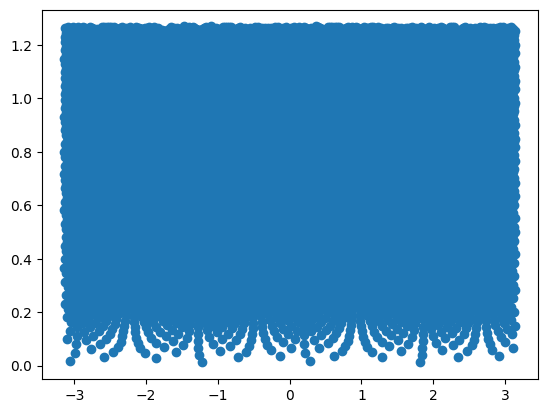

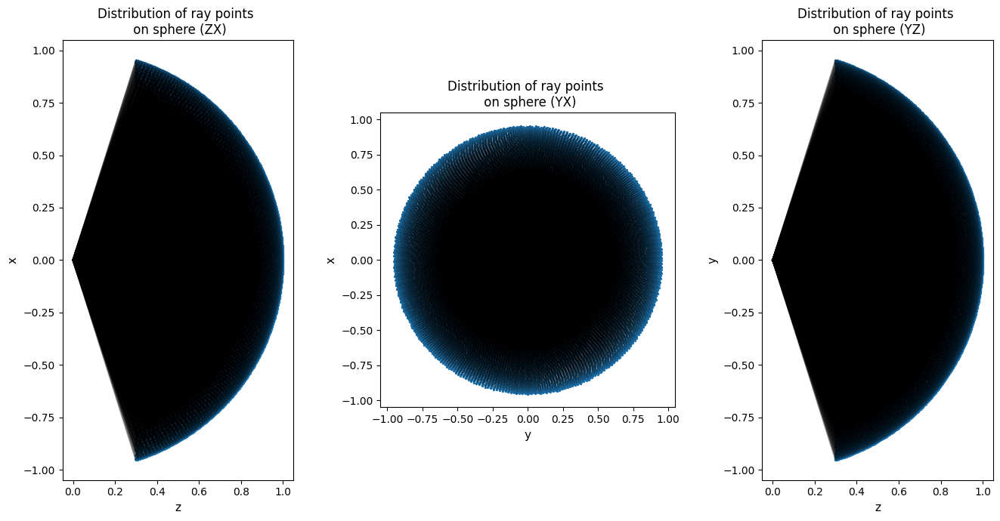

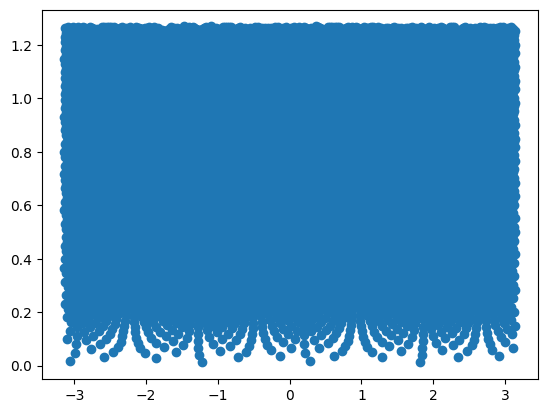

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


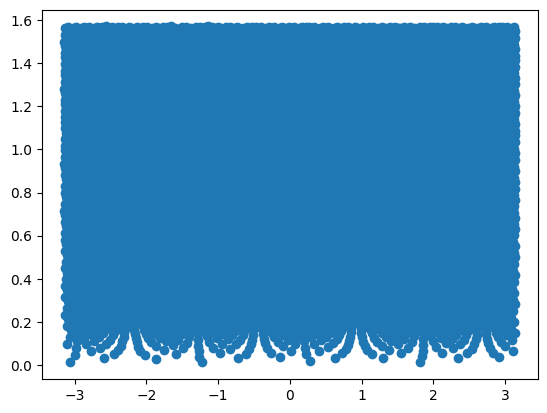

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 4.1887902092705165
initial_energy 2.9448870083026706
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 54.736703s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

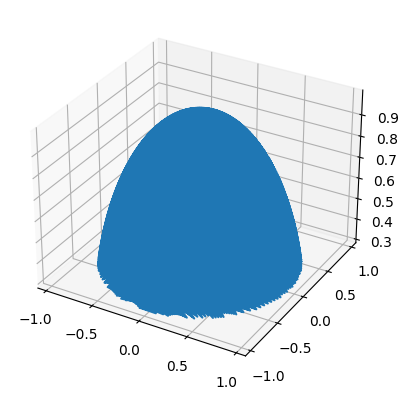

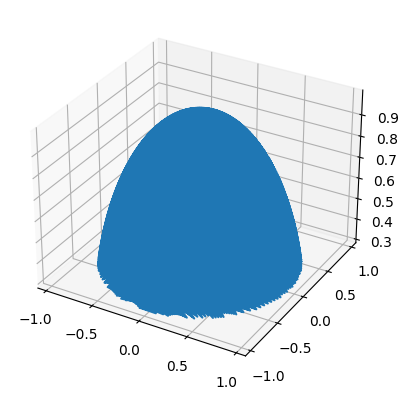

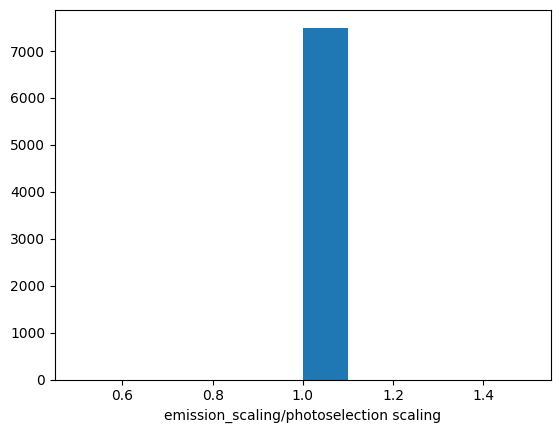

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.3389099218189974
Total energy per dipole per ray: 0.9980514257496391
Energy from Ix 2384.599627068312
Energy from Iy 3.335139813688188e-30
X/Y energy ratio = 7.149924022019592e+32
Half sphere energy 4.1887902092705165
Initial energy 2.9448870083026706
half sphere energy NA 2.944850682428919
maxr 0.004233333333333334
243 escaped out of 10554
Saved checkpoint with 10000 rays
243 escaped out of 10554
time in trace_rays 82.016313s
ray count 10311
max Ix 5.529651810071455
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003417799790003587
max_r_reduced 0.0034177916560676562 max_r 0.003417799790003587


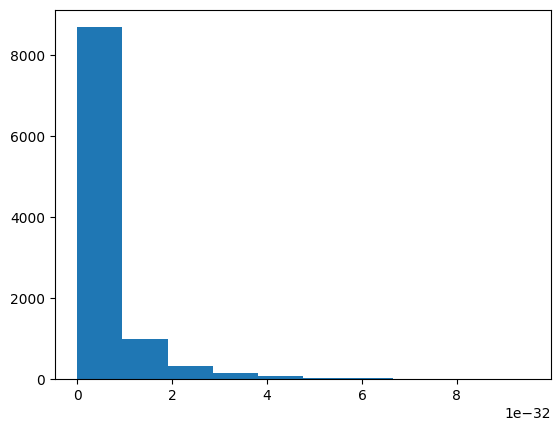

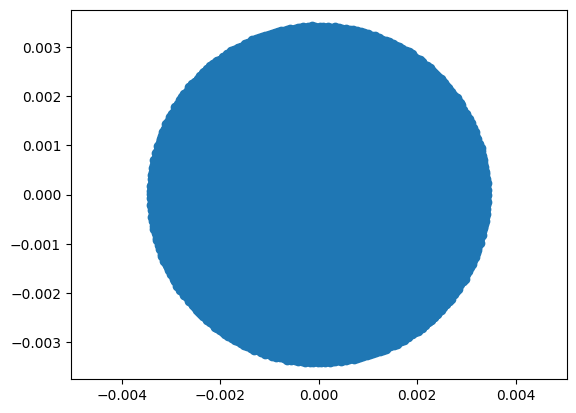

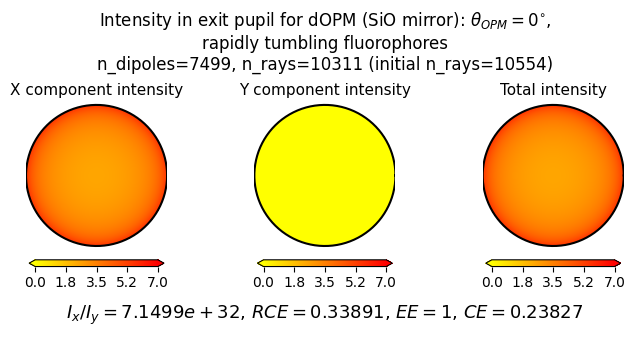

ray count 10311
max Ix 3.333547387795115
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493865713496701 max_r 0.949388830776318


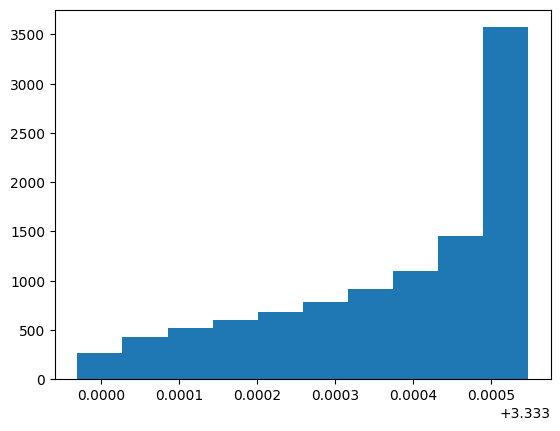

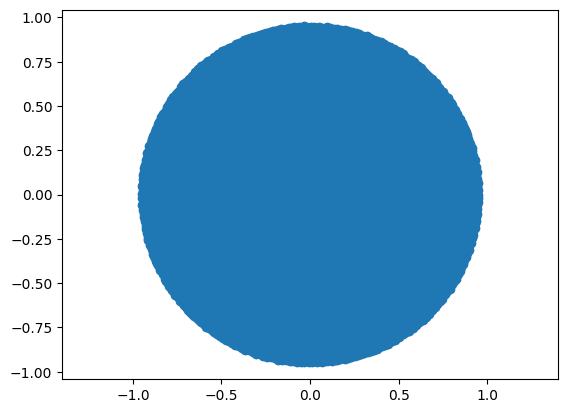

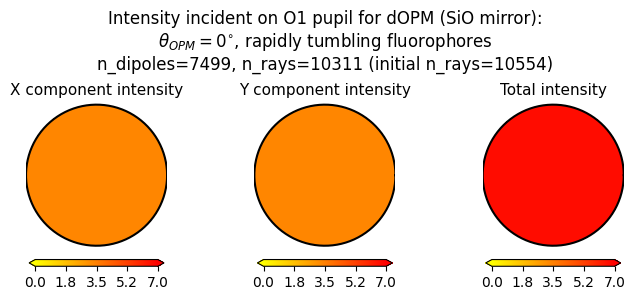

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


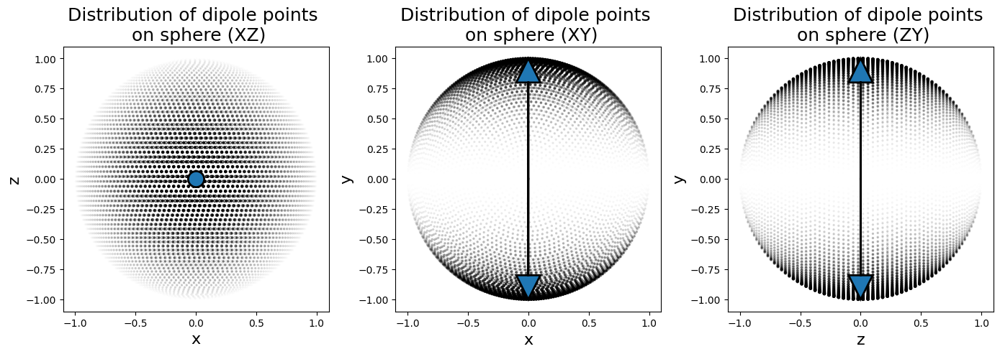

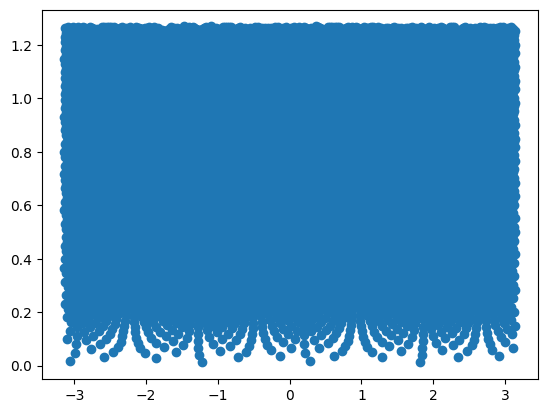

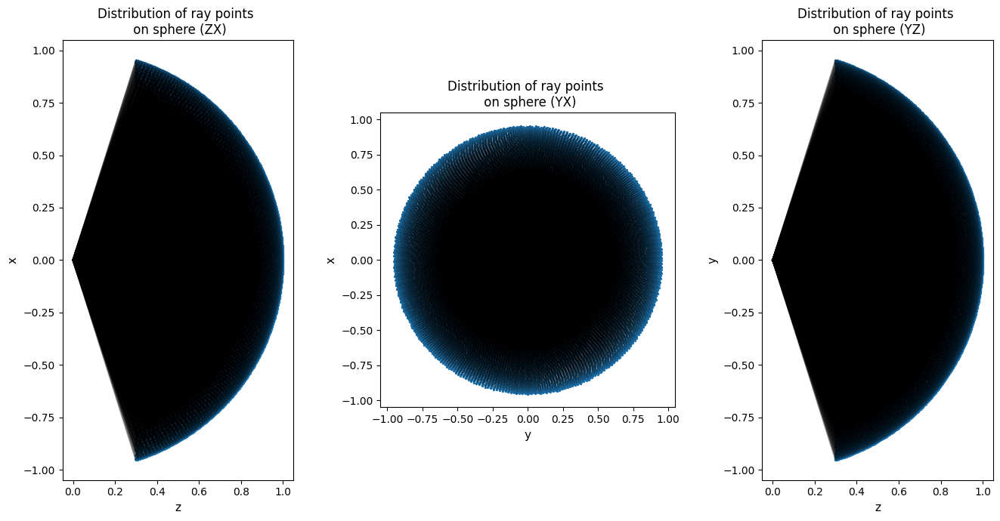

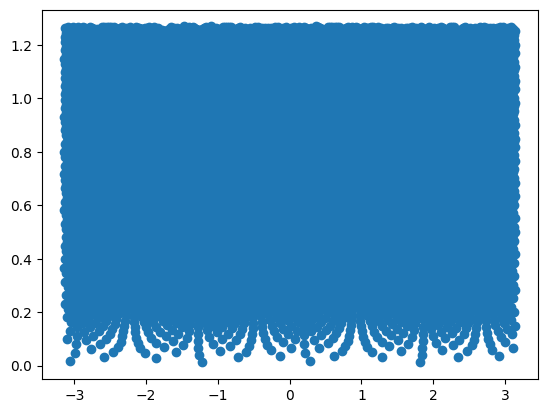

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


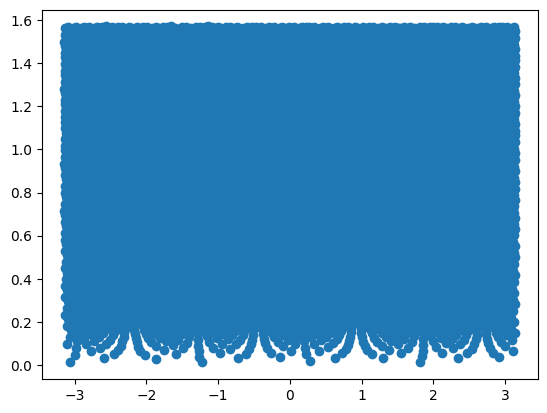

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3969878565785856
initial_energy 1.0198594547783963
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 54.401377s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

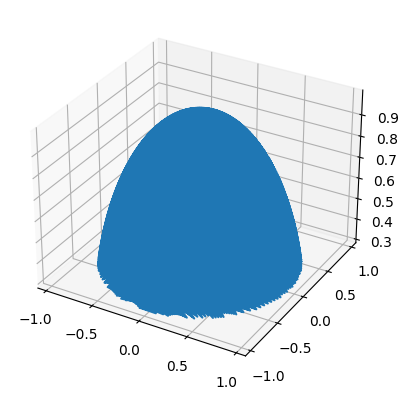

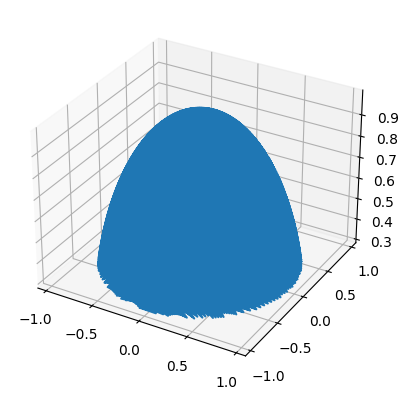

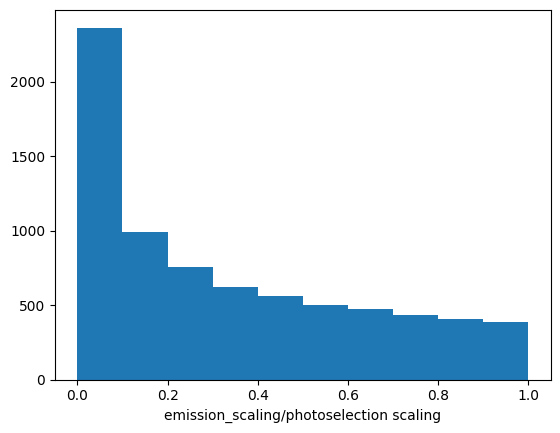

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.4806543514078541
Total energy per dipole per ray: 0.4901998847636778
Energy from Ix 1171.2126572219552
Energy from Iy 1.6067992727071828e-30
X/Y energy ratio = 7.289103730104766e+32
Half sphere energy 1.3969878565785856
Initial energy 1.0198594547783963
half sphere energy NA 0.9821262076304378
maxr 0.004233333333333334
243 escaped out of 10554
Saved checkpoint with 10000 rays
243 escaped out of 10554
time in trace_rays 82.597375s
ray count 10311
max Ix 3.31332534735226
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003417799790003587
max_r_reduced 0.0034177916560676562 max_r 0.003417799790003587


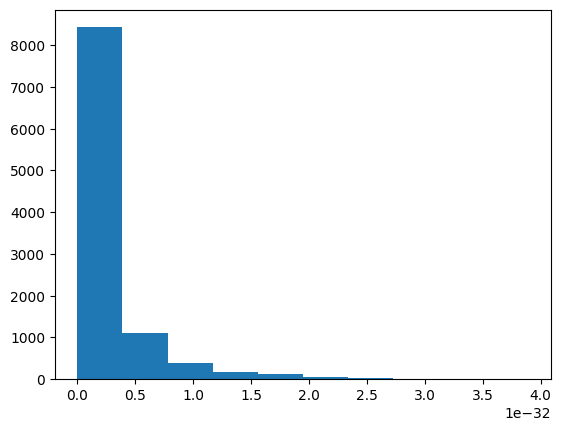

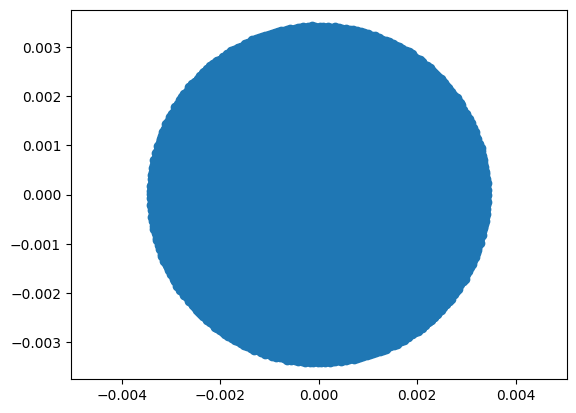

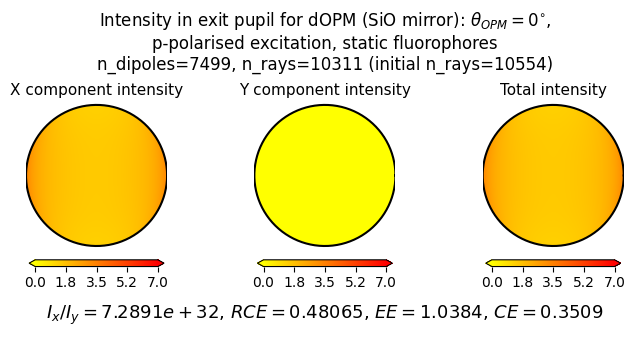

ray count 10311
max Ix 0.8246382214983282
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493865713496701 max_r 0.949388830776318


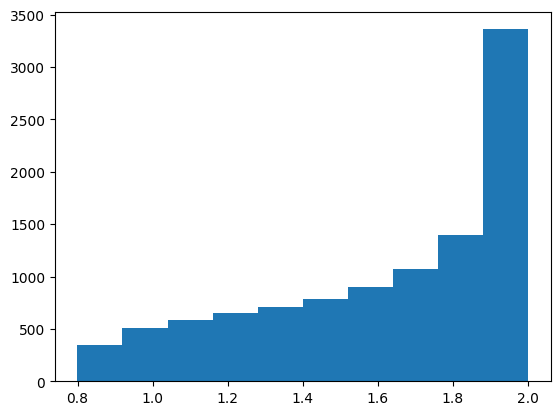

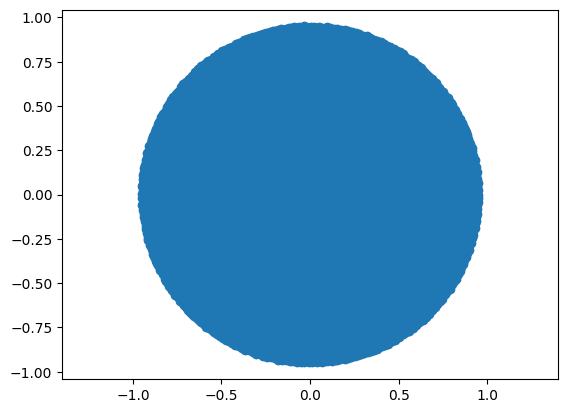

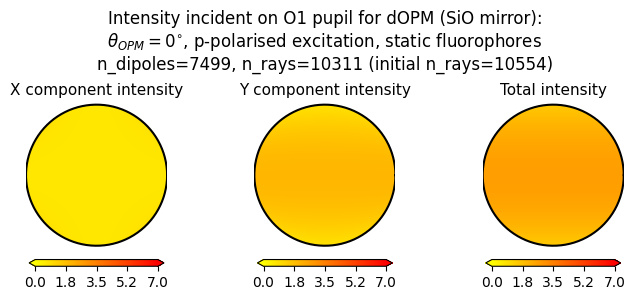

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


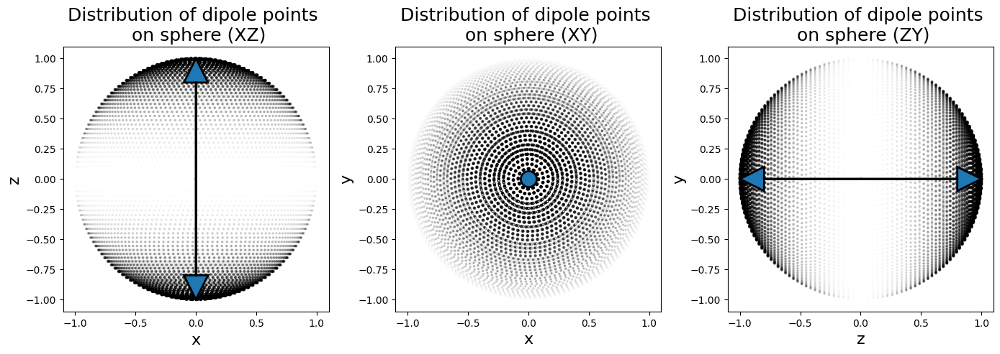

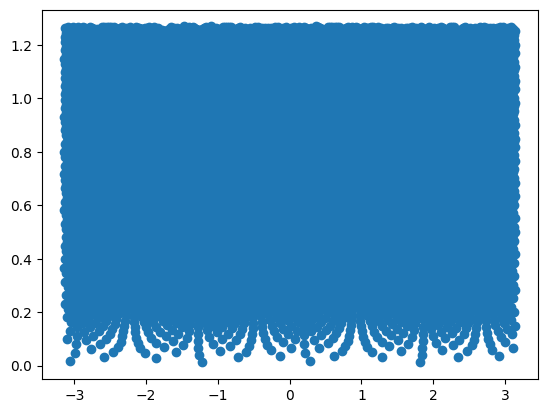

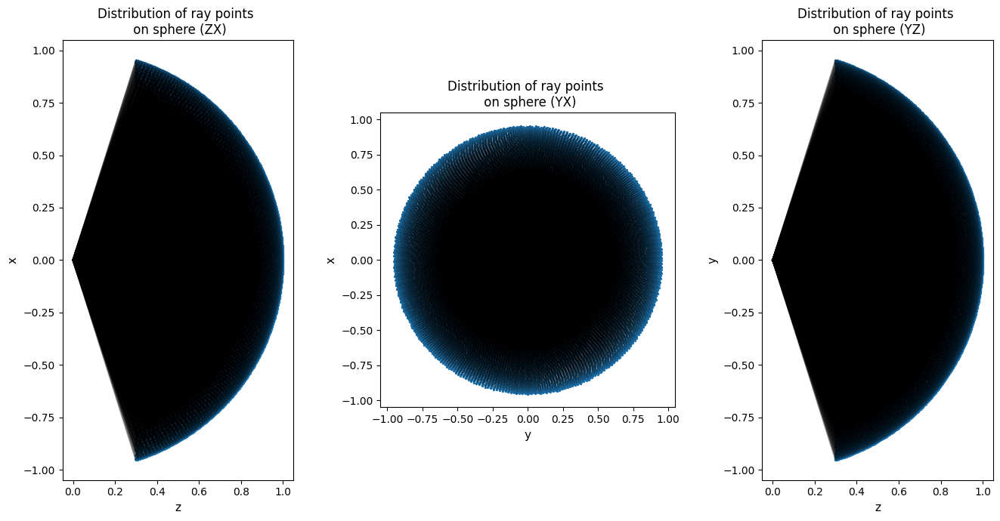

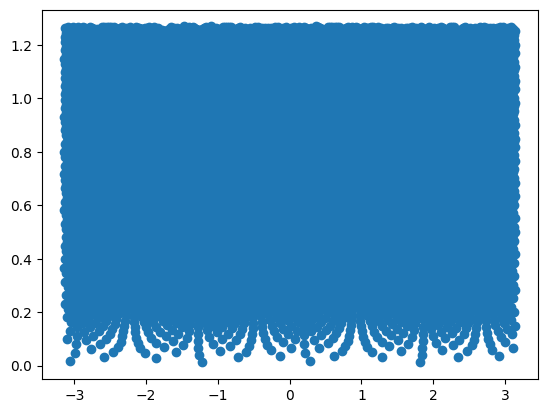

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


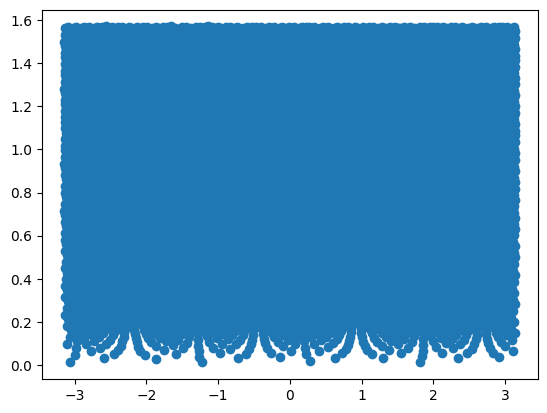

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3960747691818838
initial_energy 0.9060918239482861
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 54.284797s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACD0BD4B20>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

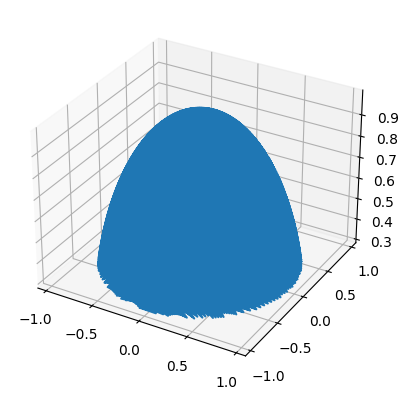

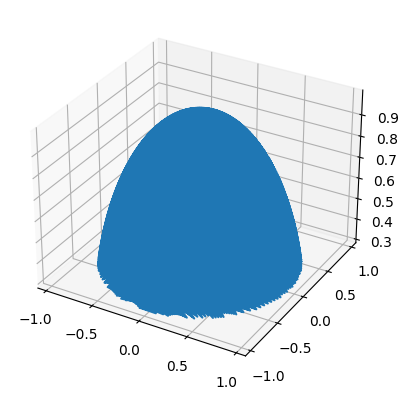

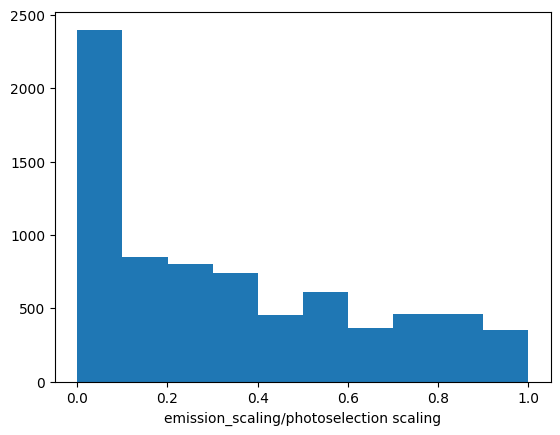

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.3324416026666637
Total energy per dipole per ray: 0.3012226181165288
Energy from Ix 4.6591243223654484e-30
Energy from Iy 719.6977272846452
X/Y energy ratio = 6.473723822838659e-33
Half sphere energy 1.3960747691818838
Initial energy 0.9060918239482861
half sphere energy NA 0.981484278598675
maxr 0.004233333333333334
243 escaped out of 10554
Saved checkpoint with 10000 rays
243 escaped out of 10554
time in trace_rays 83.258231s
ray count 10311
max Ix 2.5163943115567955e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003417799790003587
max_r_reduced 0.0034177916560676562 max_r 0.003417799790003587


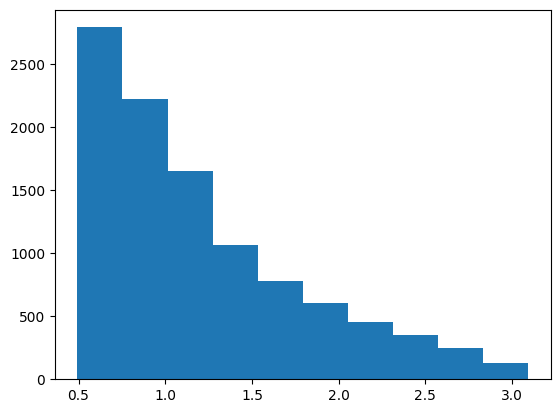

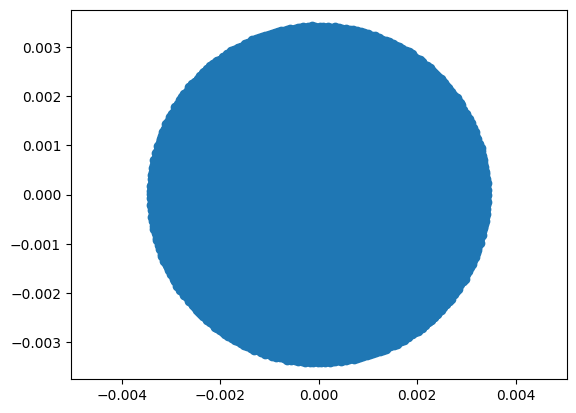

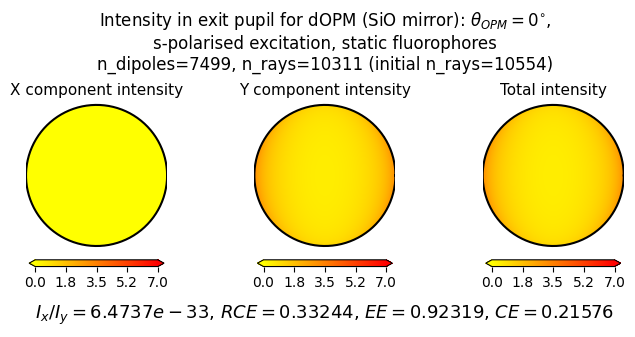

ray count 10311
max Ix 1.867993263000791
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493865713496701 max_r 0.949388830776318


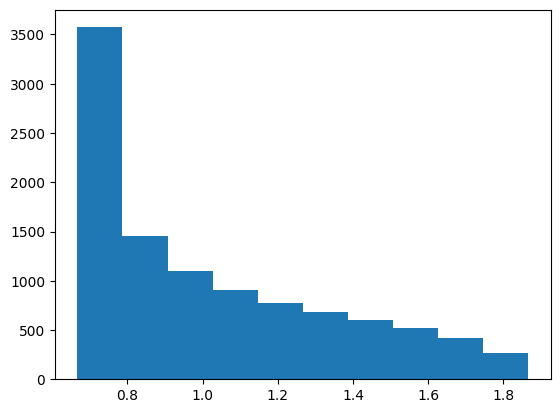

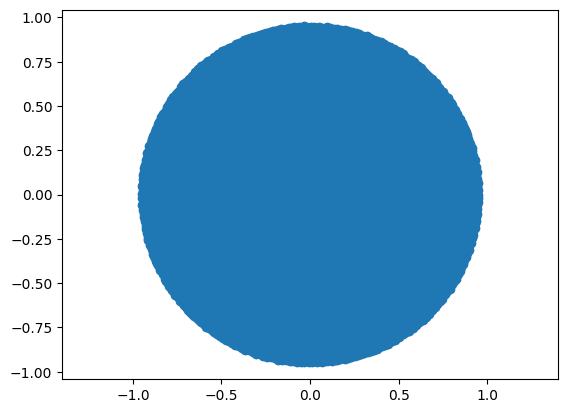

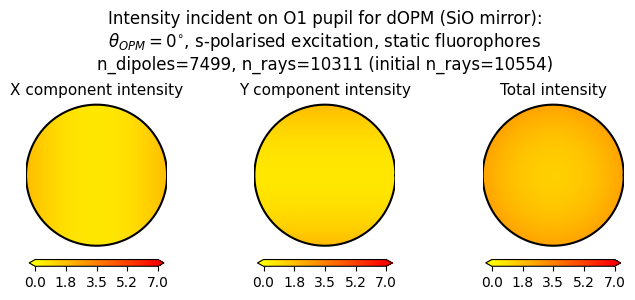

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586


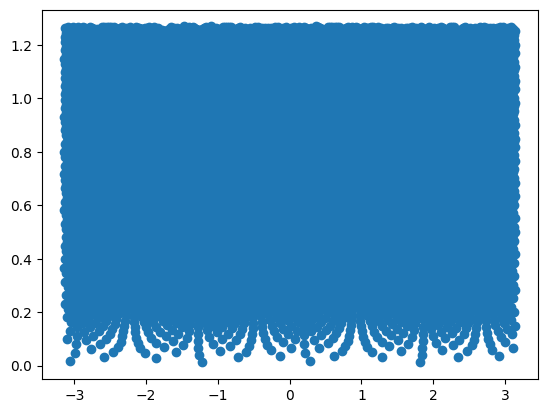

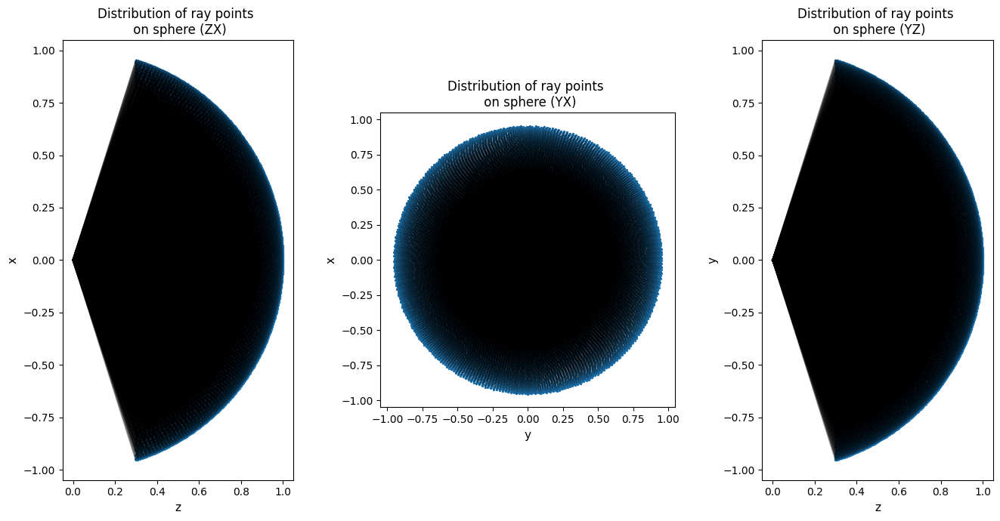

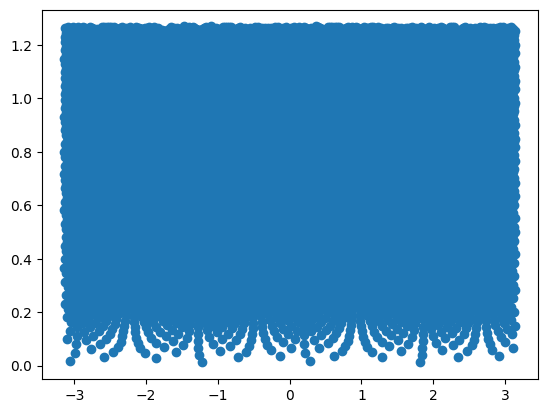

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


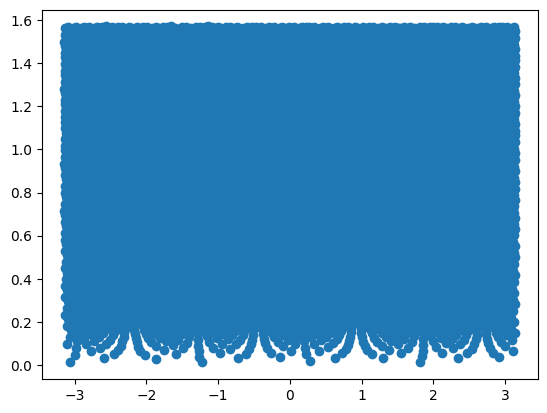

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 4.1887902092705165
initial_energy 2.9448870083026706
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 54.132497s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

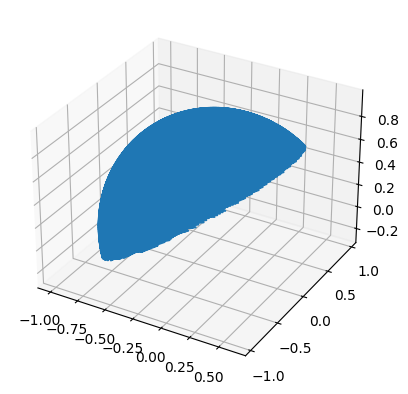

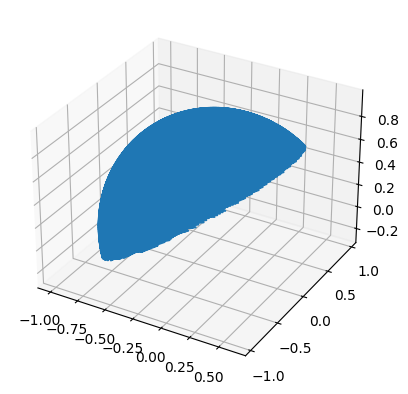

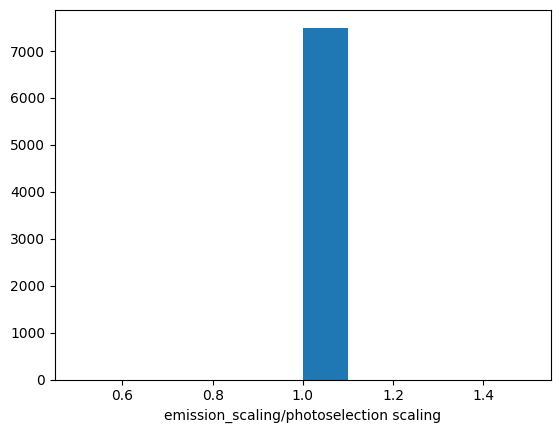

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.2593004125270523
Total energy per dipole per ray: 0.7636104160984394
Energy from Ix 1824.460209639128
Energy from Iy 2.6275106255748977e-30
X/Y energy ratio = 6.943683469367272e+32
Half sphere energy 4.1887902092705165
Initial energy 2.9448870083026706
half sphere energy NA 2.944850682428919
maxr 0.004233333333333334
3005 escaped out of 10554
Saved checkpoint with 10000 rays
3005 escaped out of 10554
time in trace_rays 79.077555s
ray count 7549
max Ix 7.446413417971232
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034168078048843575
max_r_reduced 0.003416621006211845 max_r 0.0034168078048843575


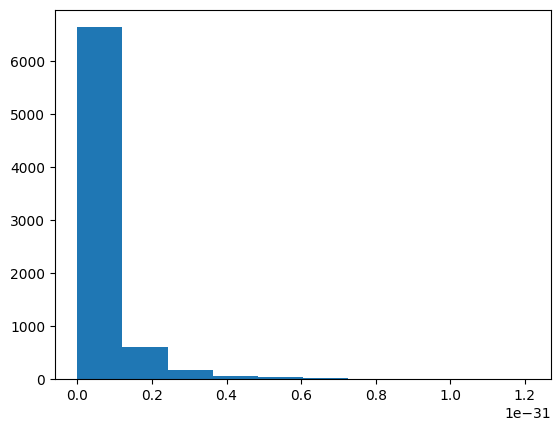

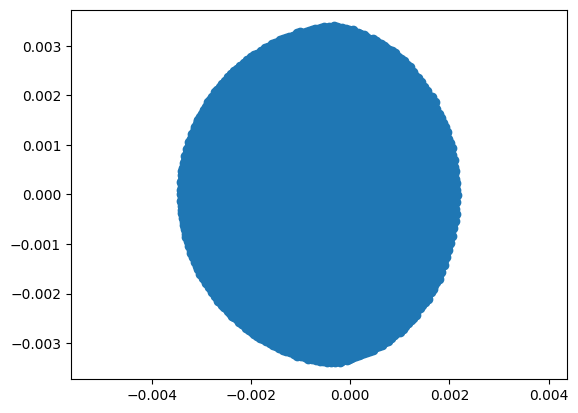

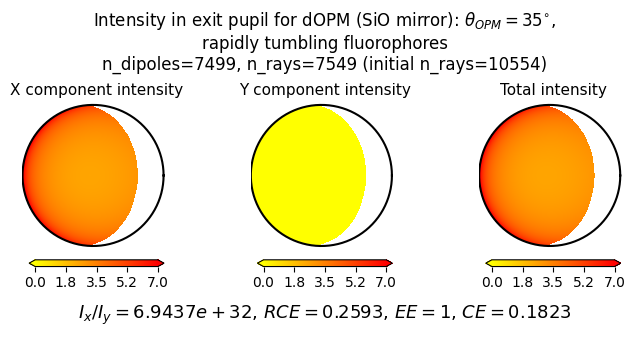

ray count 7549
max Ix 3.333547387795115
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493331864329616 max_r 0.949388830776318


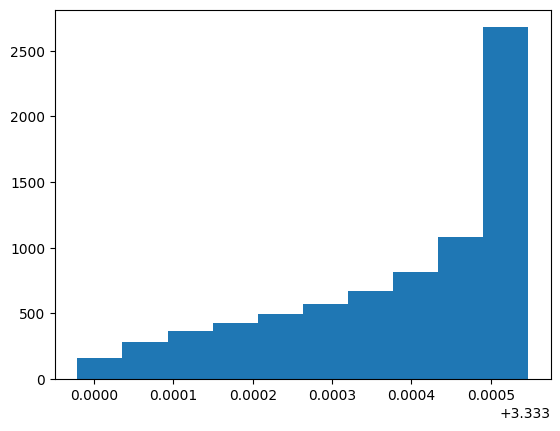

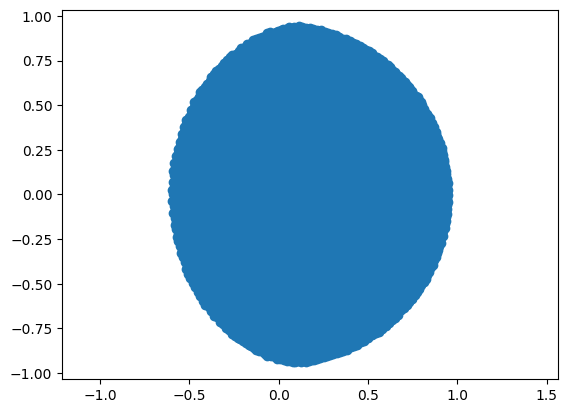

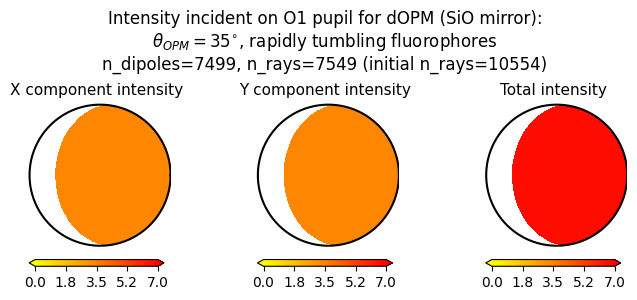

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


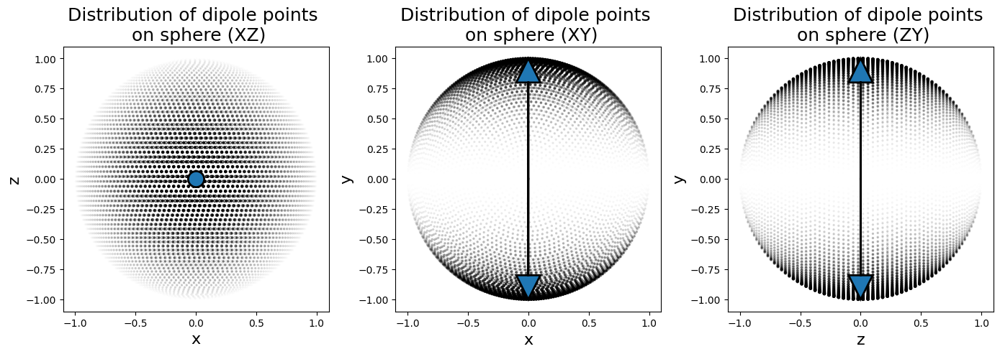

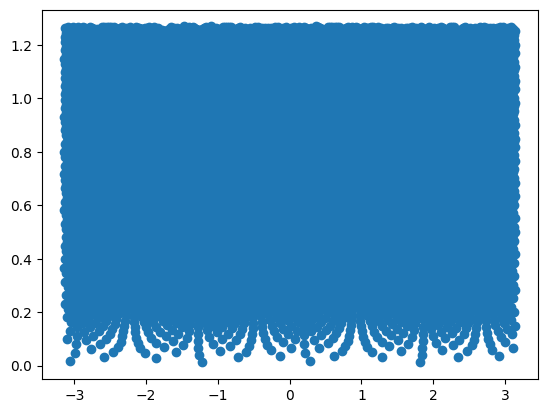

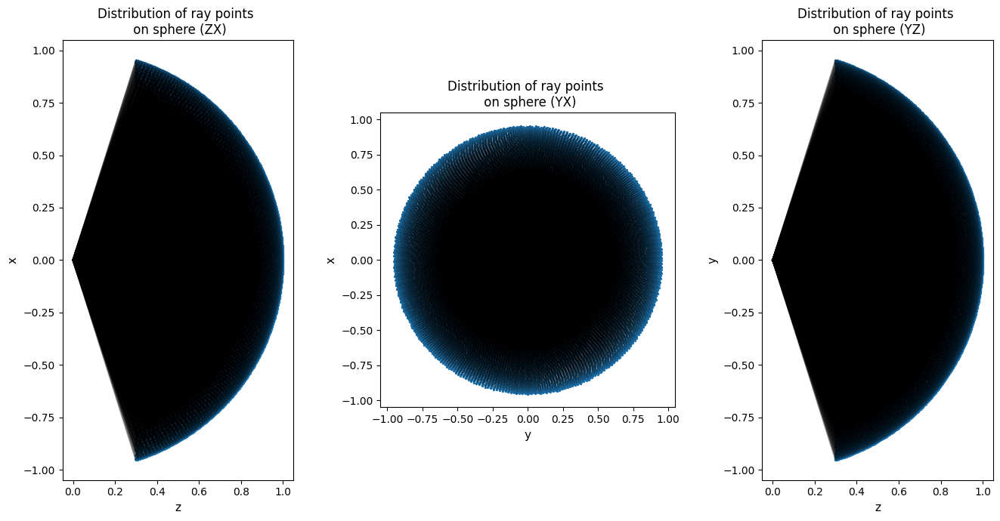

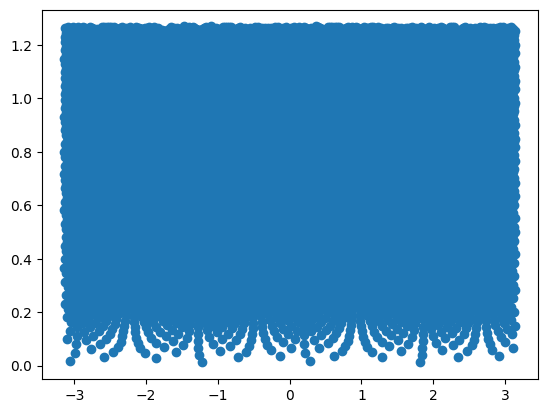

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


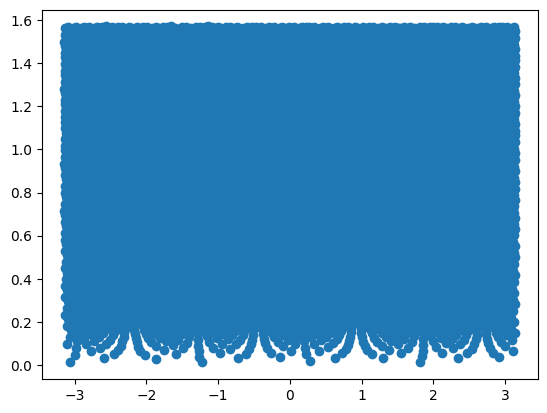

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3969878565785856
initial_energy 1.0198594547783963
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 54.387983s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

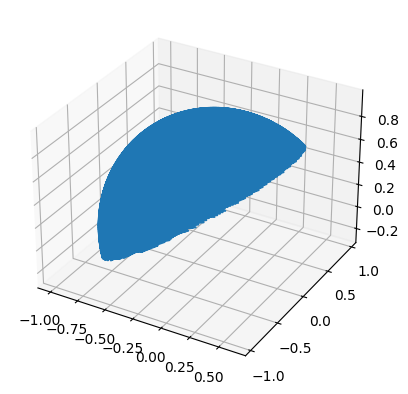

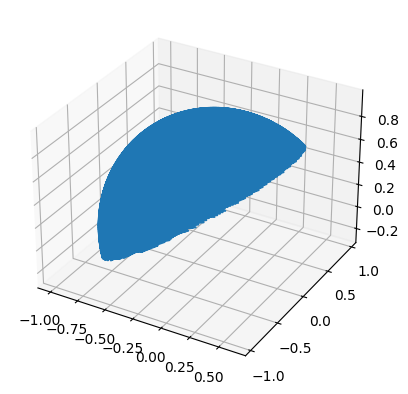

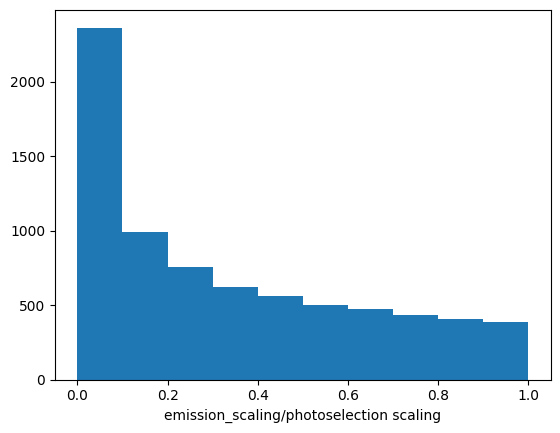

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.37214358014406235
Total energy per dipole per ray: 0.37953414874500385
Energy from Ix 906.8039644122042
Energy from Iy 1.320617468304089e-30
X/Y energy ratio = 6.86651499148125e+32
Half sphere energy 1.3969878565785856
Initial energy 1.0198594547783963
half sphere energy NA 0.9821262076304378
maxr 0.004233333333333334
3005 escaped out of 10554
Saved checkpoint with 10000 rays
3005 escaped out of 10554
time in trace_rays 77.225410s
ray count 7549
max Ix 4.460880824148436
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034168078048843575
max_r_reduced 0.003416621006211845 max_r 0.0034168078048843575


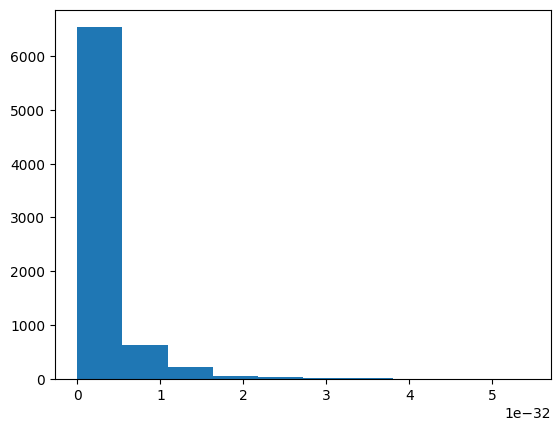

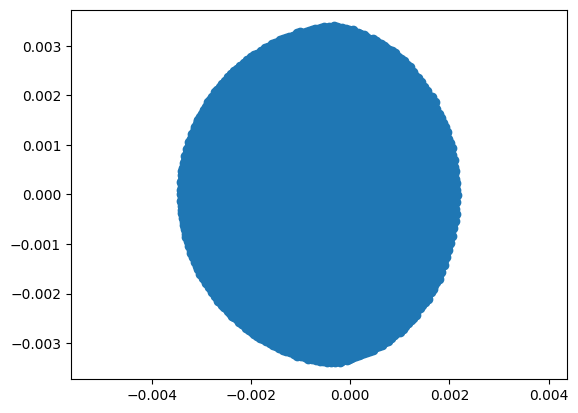

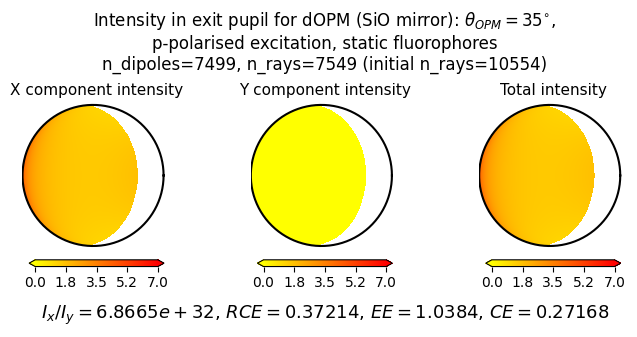

ray count 7549
max Ix 0.8246382214983282
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493331864329616 max_r 0.949388830776318


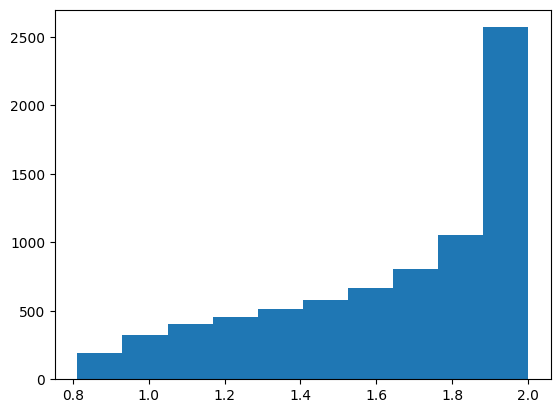

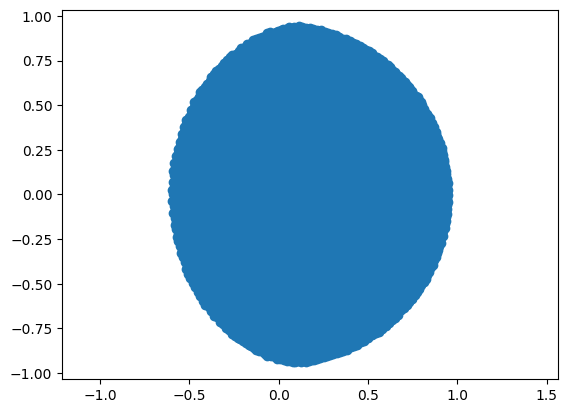

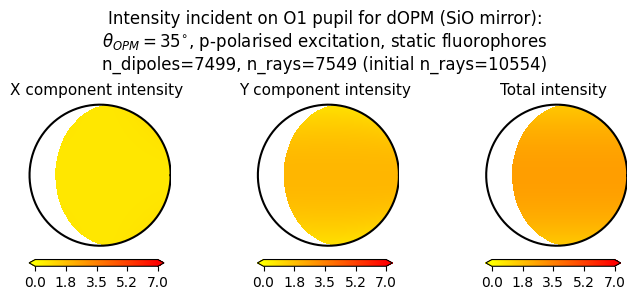

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


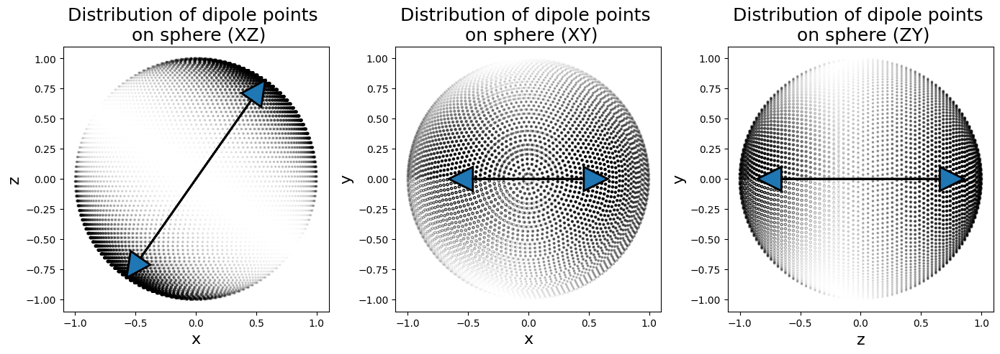

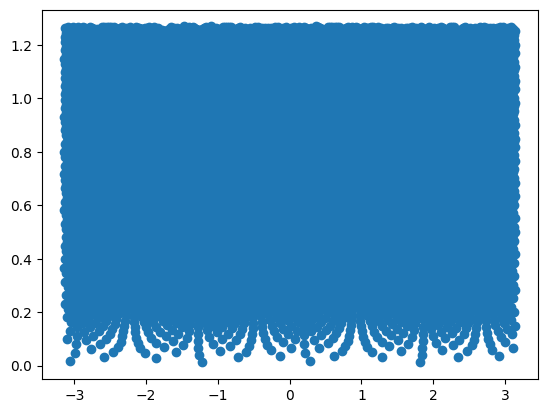

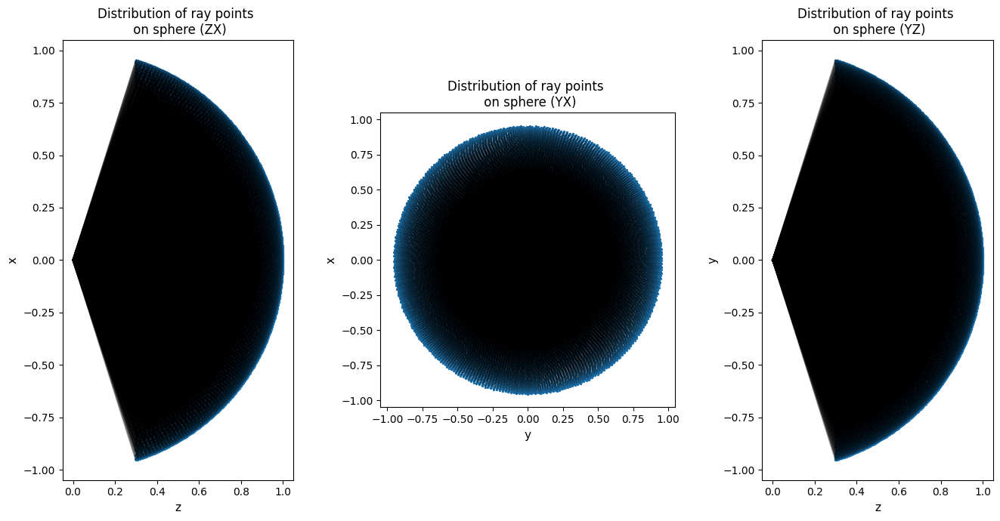

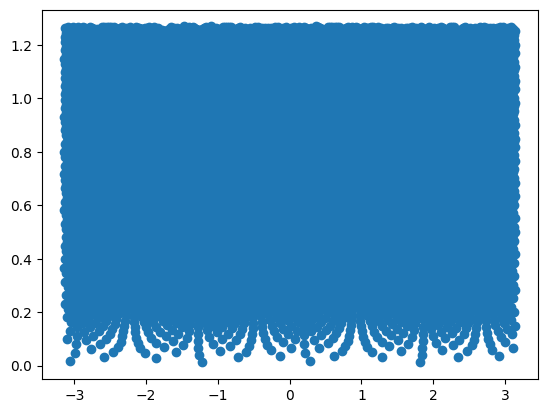

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


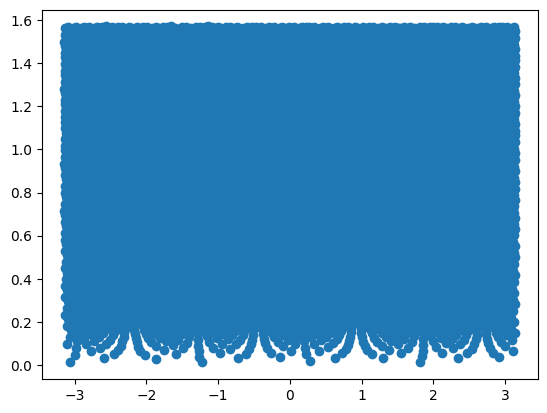

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3963986294533268
initial_energy 0.9434971194444461
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 52.807499s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACD0BD4B20>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

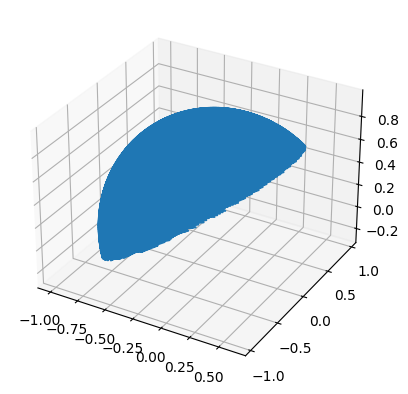

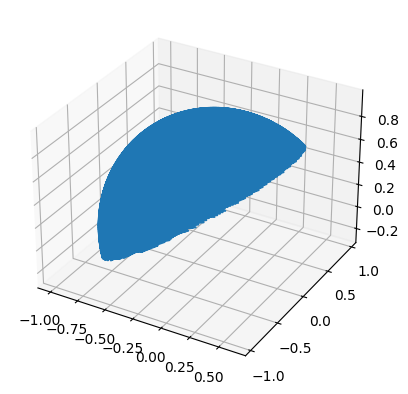

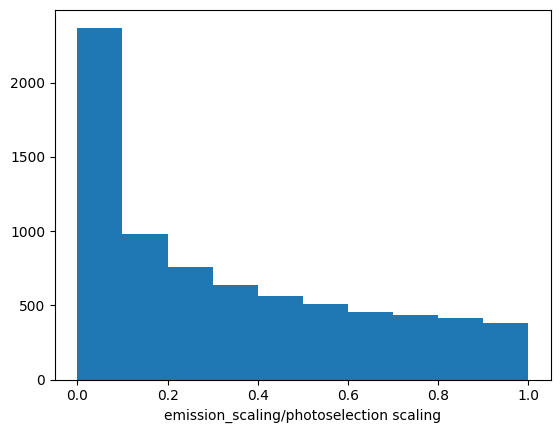

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.24446944096987216
Total energy per dipole per ray: 0.23065621334726846
Energy from Ix 3.754857252095417e-30
Energy from Iy 551.0965729203401
X/Y energy ratio = 6.813428782904397e-33
Half sphere energy 1.3963986294533268
Initial energy 0.9434971194444461
half sphere energy NA 0.9817119625106694
maxr 0.004233333333333334
3005 escaped out of 10554
Saved checkpoint with 10000 rays
3005 escaped out of 10554
time in trace_rays 76.011098s
ray count 7549
max Ix 3.196363422842041e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034168078048843575
max_r_reduced 0.003416621006211845 max_r 0.0034168078048843575


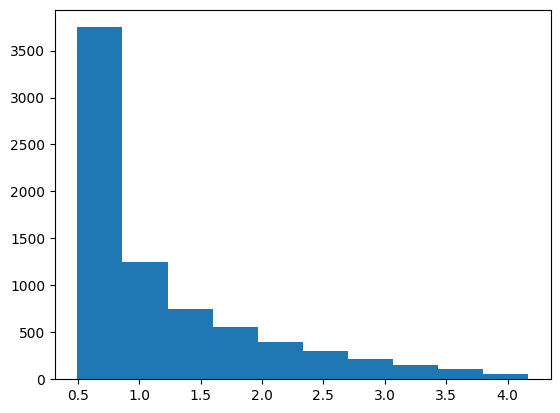

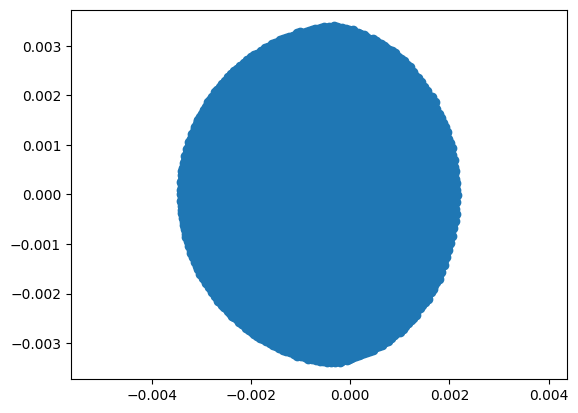

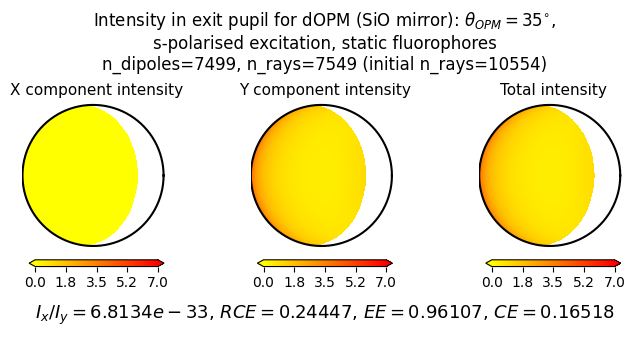

ray count 7549
max Ix 1.8686326929605535
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493331864329616 max_r 0.949388830776318


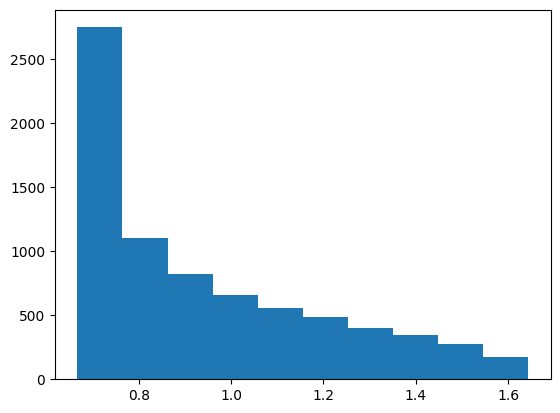

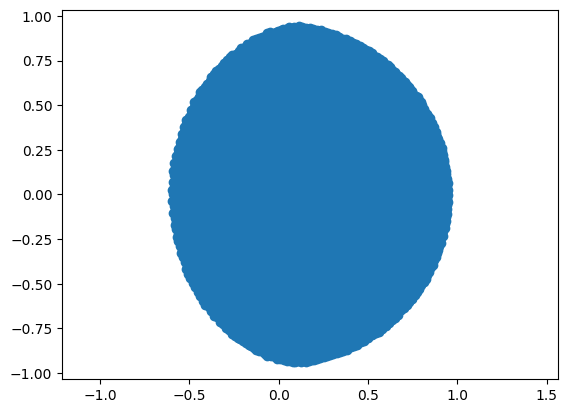

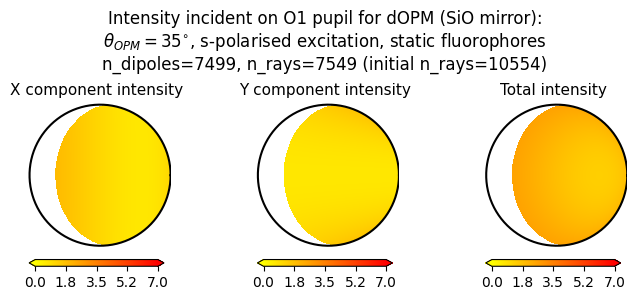

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586


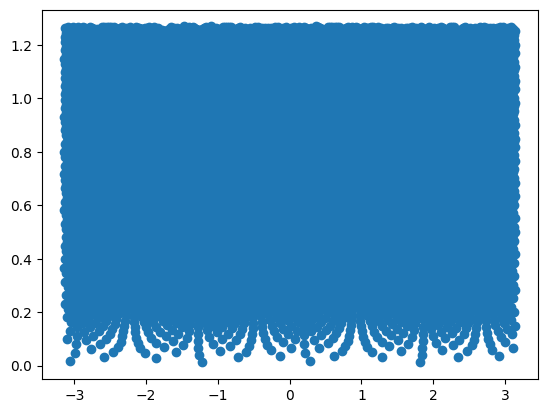

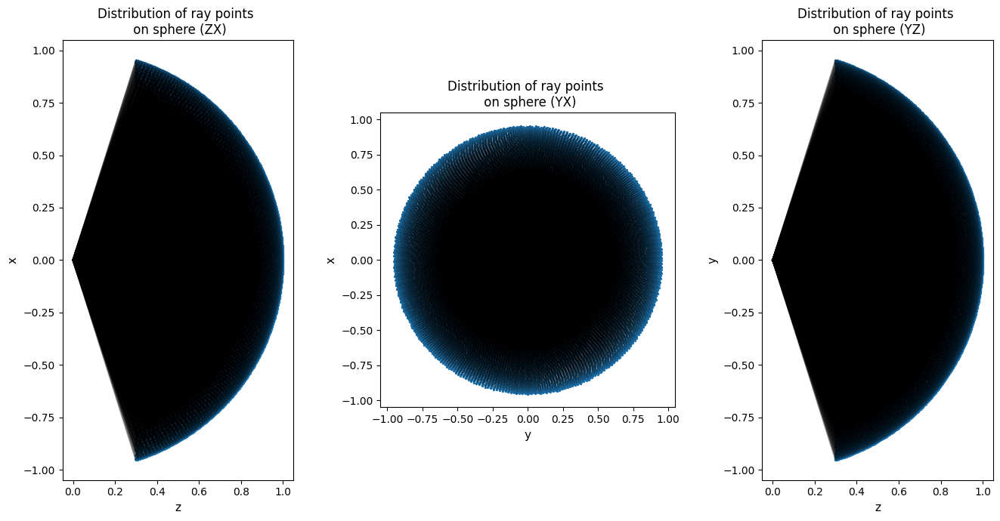

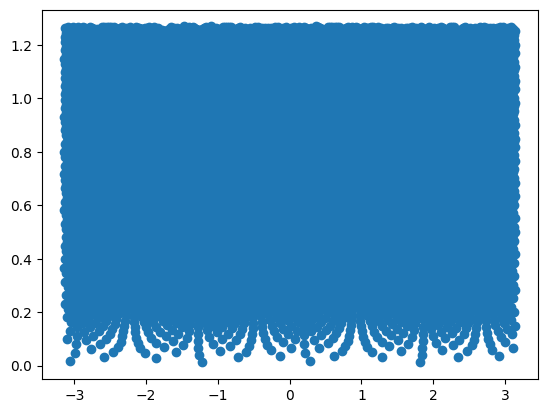

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


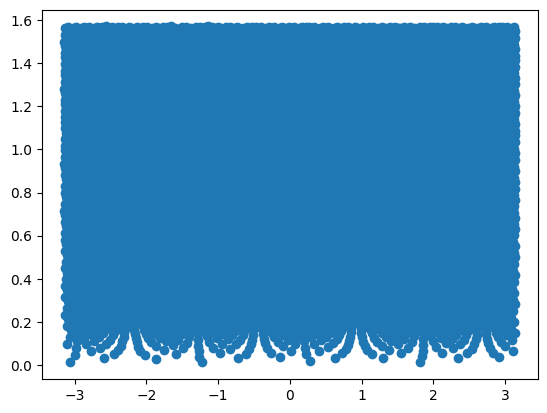

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 4.1887902092705165
initial_energy 2.9448870083026706
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 52.063936s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

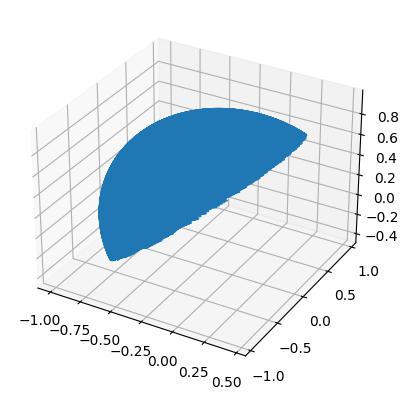

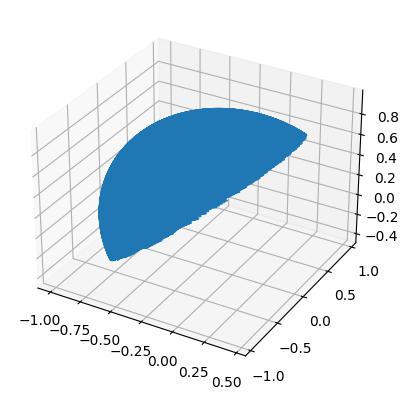

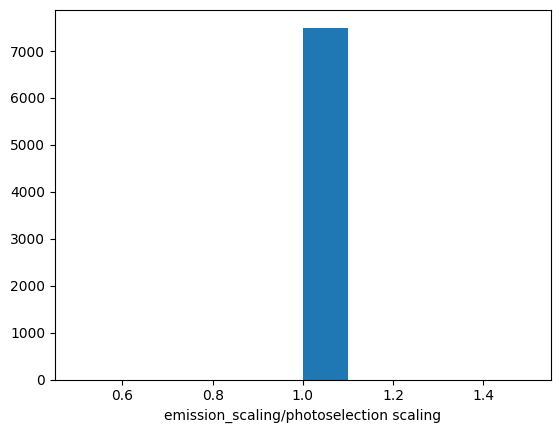

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.23374013564081353
Total energy per dipole per ray: 0.6883382887675358
Energy from Ix 1644.6158828529678
Energy from Iy 2.242632965706502e-30
X/Y energy ratio = 7.333415266794941e+32
Half sphere energy 4.1887902092705165
Initial energy 2.9448870083026706
half sphere energy NA 2.944850682428919
maxr 0.004233333333333334
3796 escaped out of 10554
Saved checkpoint with 10000 rays
3796 escaped out of 10554
time in trace_rays 74.616581s
ray count 6758
max Ix 7.648224063811656
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034110289802032553
max_r_reduced 0.0034104466090931537 max_r 0.0034110289802032553


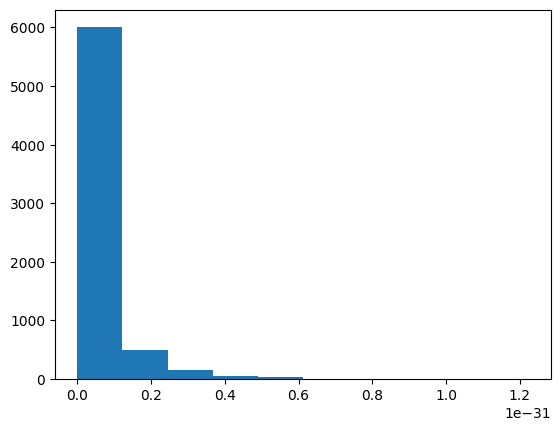

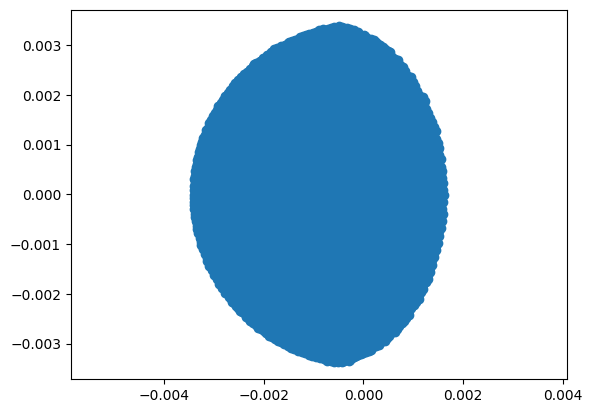

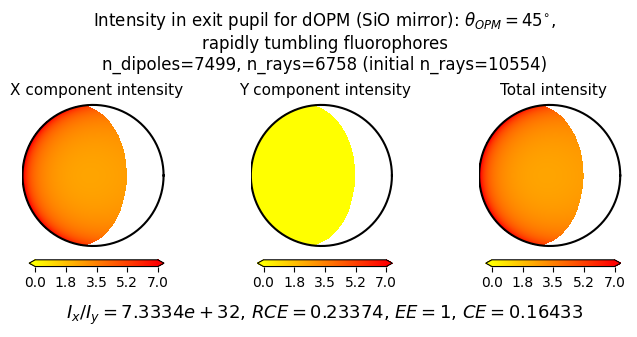

ray count 6758
max Ix 3.333547387795115
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9492122220159005 max_r 0.949388830776318


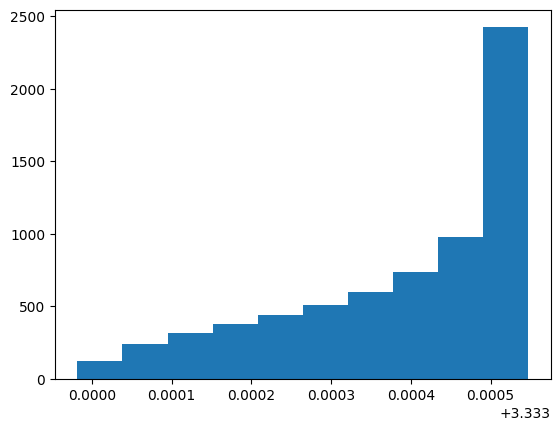

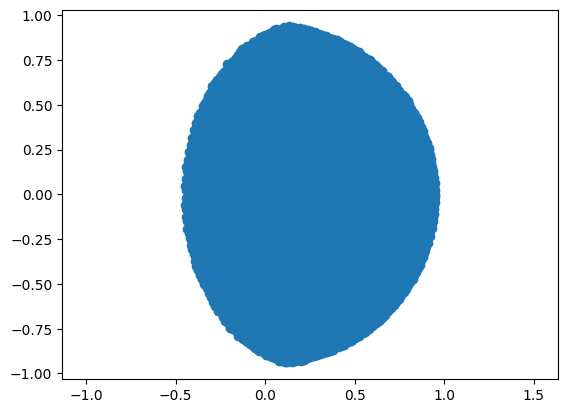

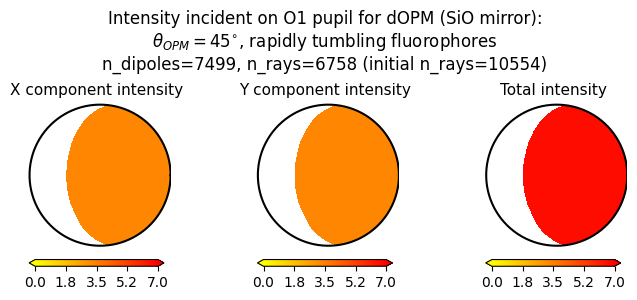

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


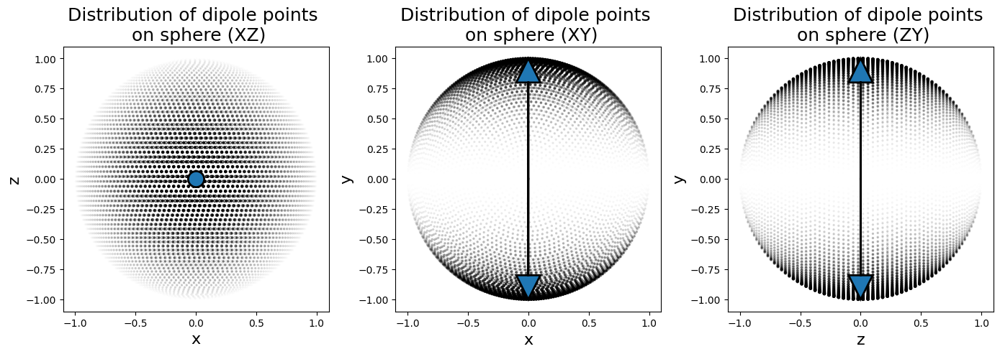

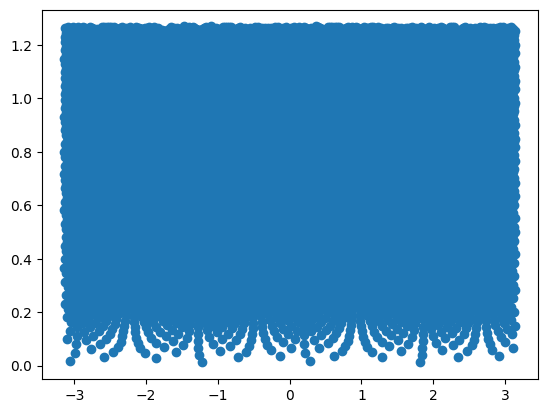

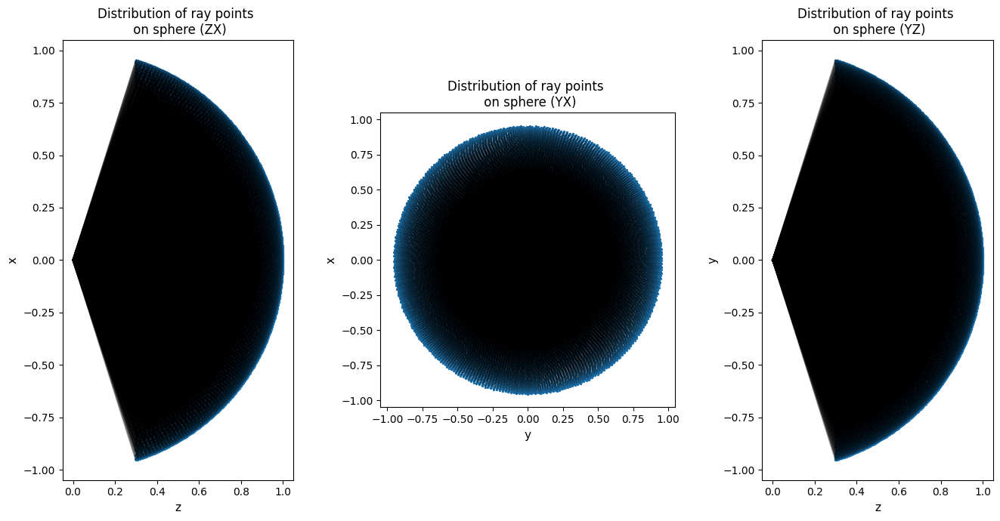

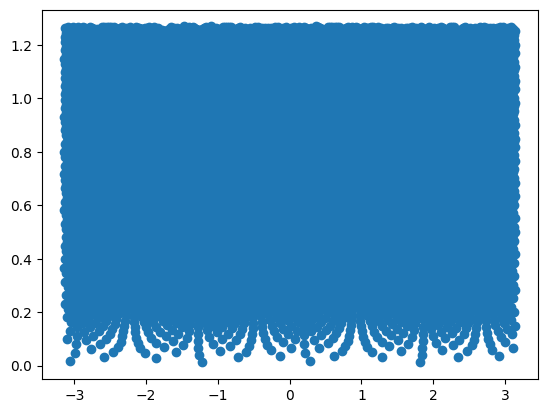

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


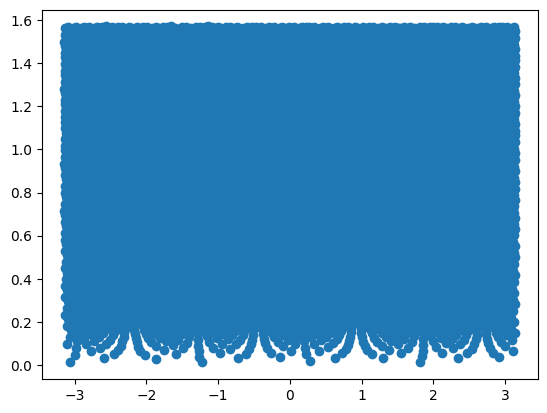

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3969878565785856
initial_energy 1.0198594547783963
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 53.888600s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

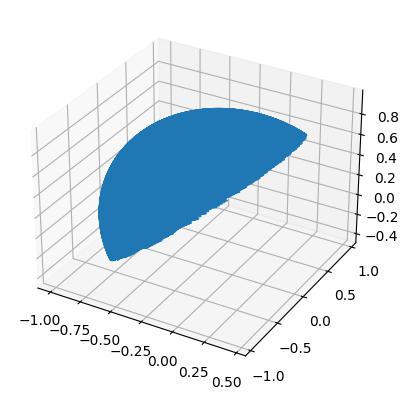

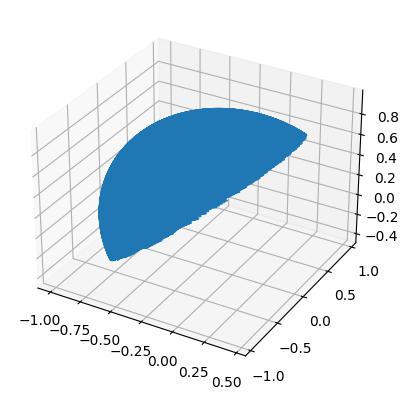

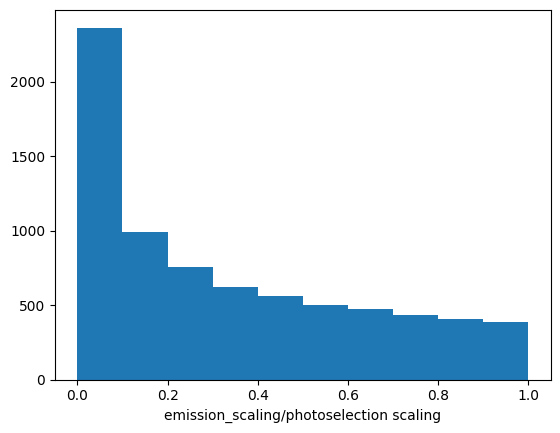

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.3363764233179437
Total energy per dipole per ray: 0.3430566756853451
Energy from Ix 819.6499697278897
Energy from Iy 1.12850501417456e-30
X/Y energy ratio = 7.263148673977484e+32
Half sphere energy 1.3969878565785856
Initial energy 1.0198594547783963
half sphere energy NA 0.9821262076304378
maxr 0.004233333333333334
3796 escaped out of 10554
Saved checkpoint with 10000 rays
3796 escaped out of 10554
time in trace_rays 75.495078s
ray count 6758
max Ix 4.579607435961448
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034110289802032553
max_r_reduced 0.0034104466090931537 max_r 0.0034110289802032553


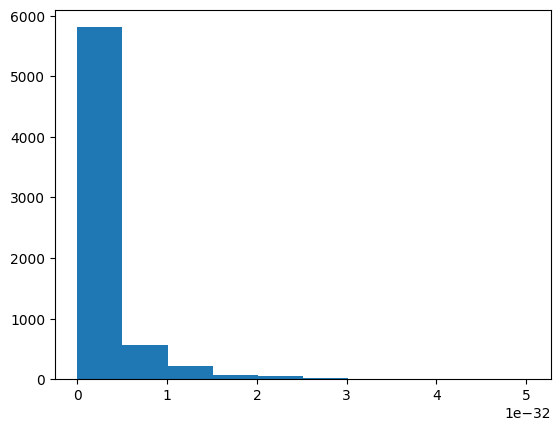

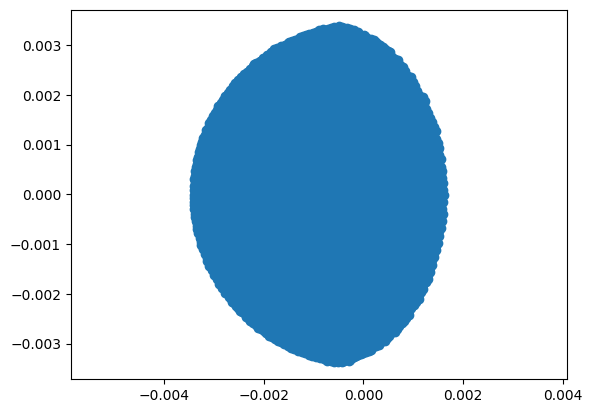

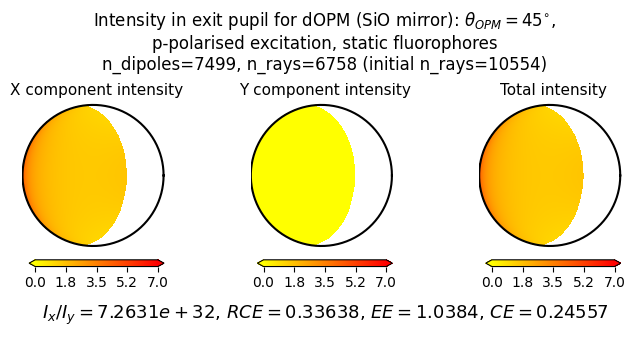

ray count 6758
max Ix 0.8246382214983282
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9492122220159005 max_r 0.949388830776318


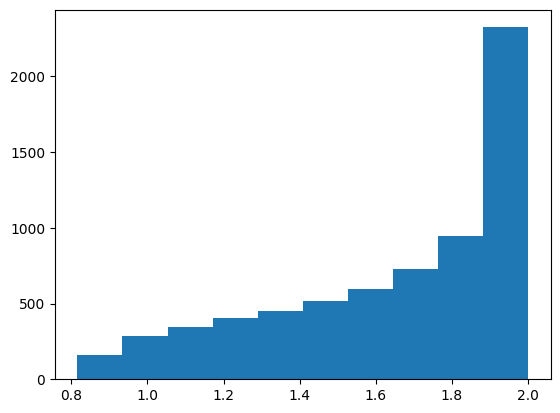

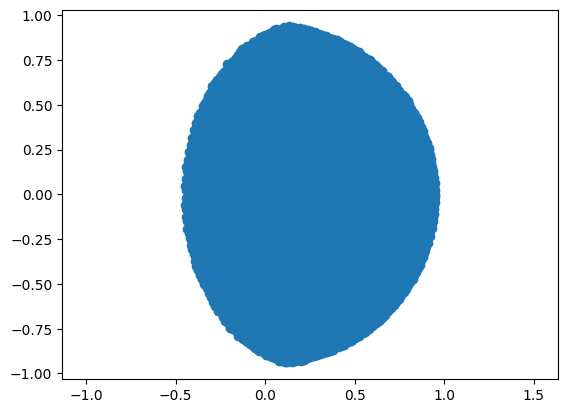

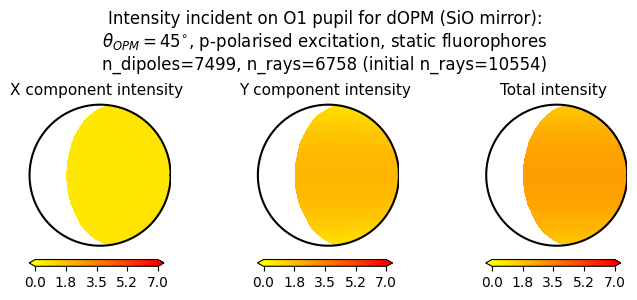

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


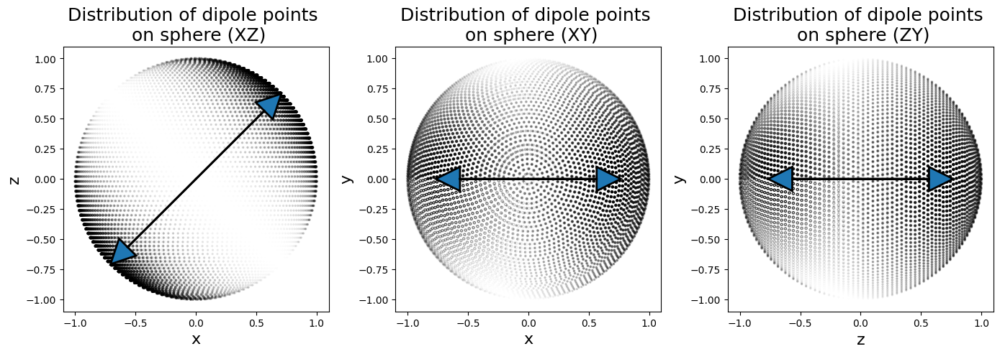

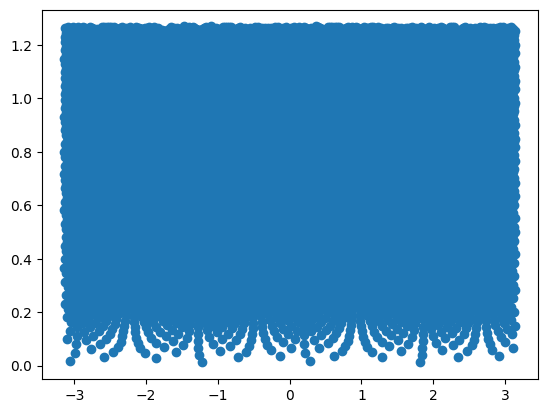

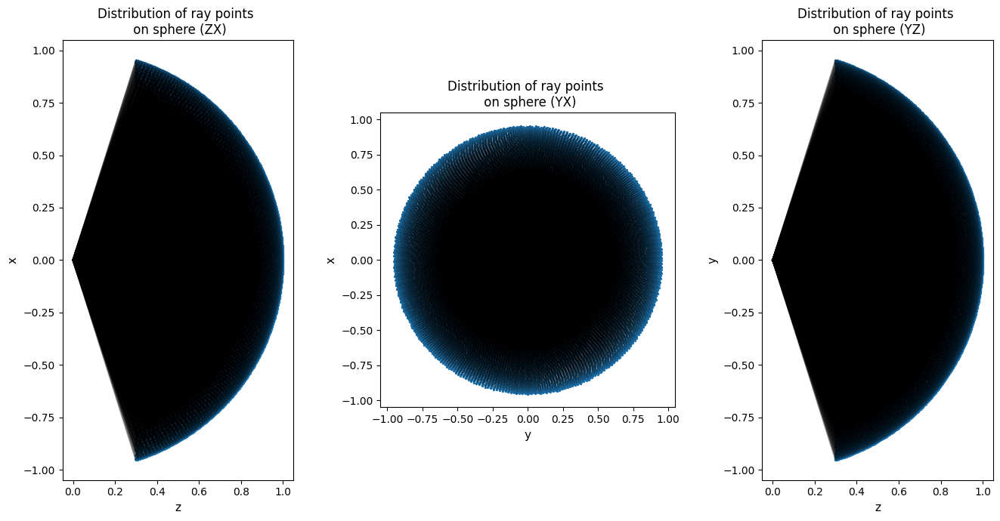

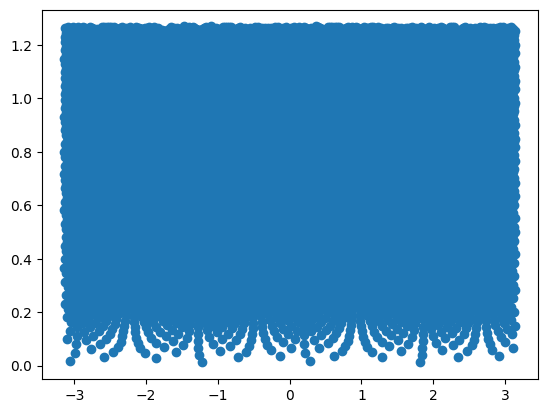

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


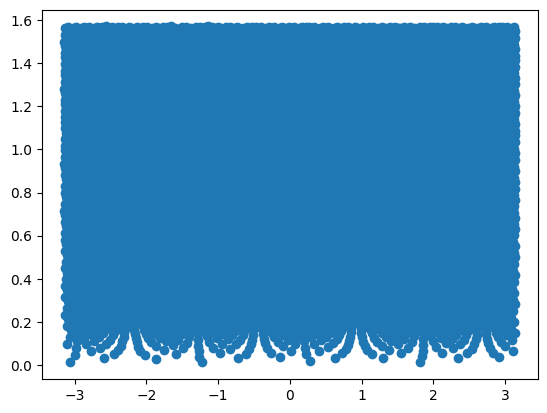

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3964762047849069
initial_energy 0.9628948334071702
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 53.814883s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACD0BD4B20>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

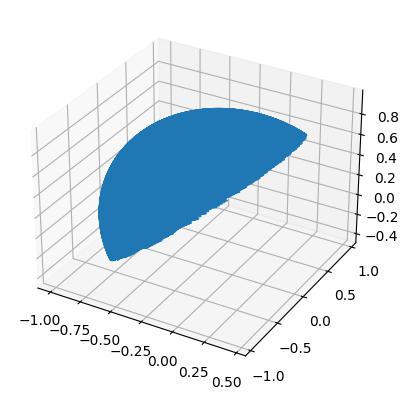

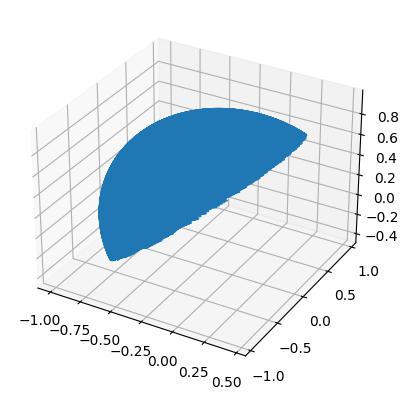

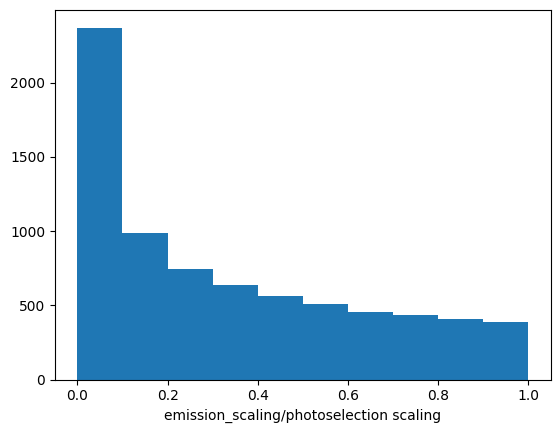

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.22497843486983987
Total energy per dipole per ray: 0.21663057256420035
Energy from Ix 3.5141305286623e-30
Energy from Iy 517.5857367872447
X/Y energy ratio = 6.789465549176821e-33
Half sphere energy 1.3964762047849069
Initial energy 0.9628948334071702
half sphere energy NA 0.9817665003979185
maxr 0.004233333333333334
3796 escaped out of 10554
Saved checkpoint with 10000 rays
3796 escaped out of 10554
time in trace_rays 75.765183s
ray count 6758
max Ix 2.5558151448826013e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034110289802032553
max_r_reduced 0.0034104466090931537 max_r 0.0034110289802032553


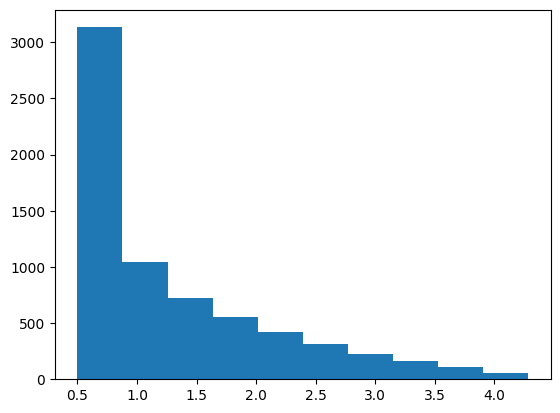

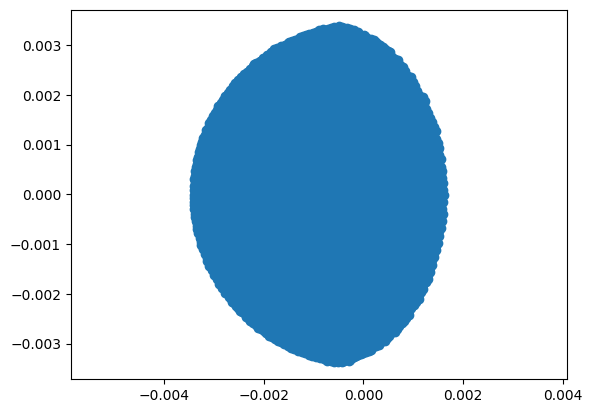

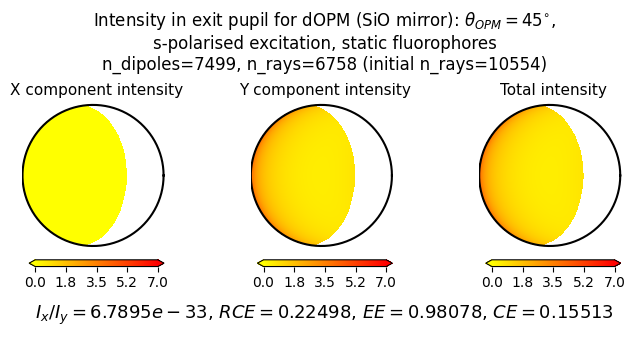

ray count 6758
max Ix 1.867293884941279
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9492122220159005 max_r 0.949388830776318


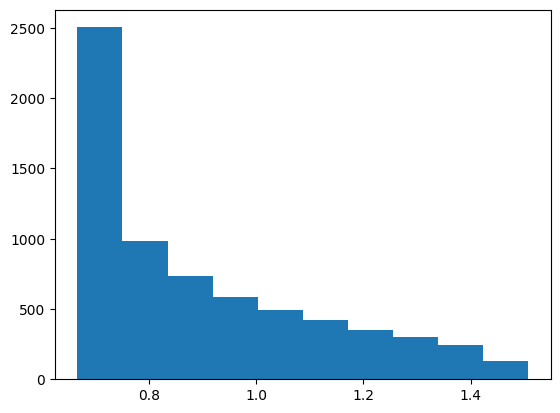

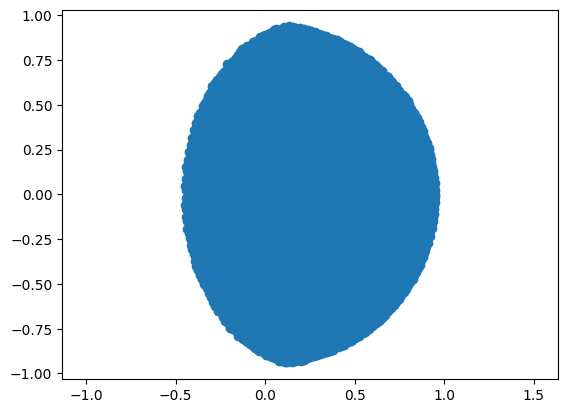

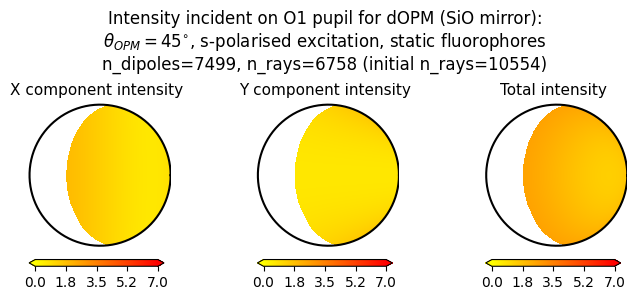

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586


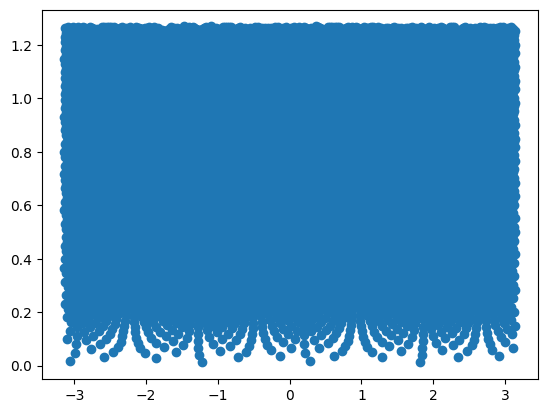

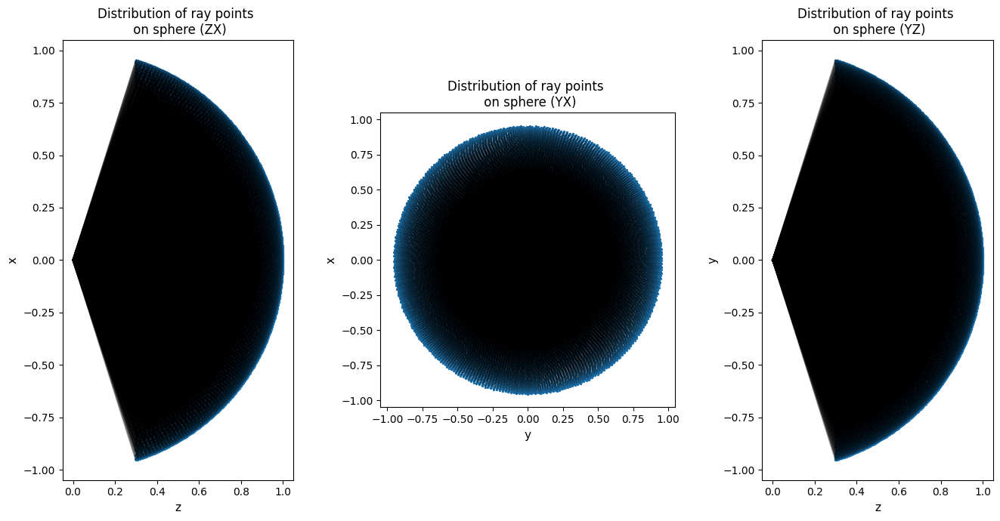

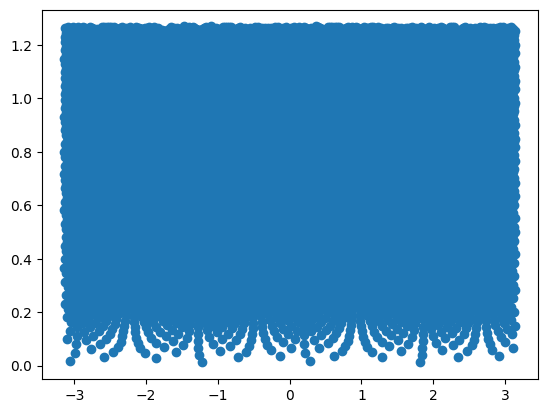

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


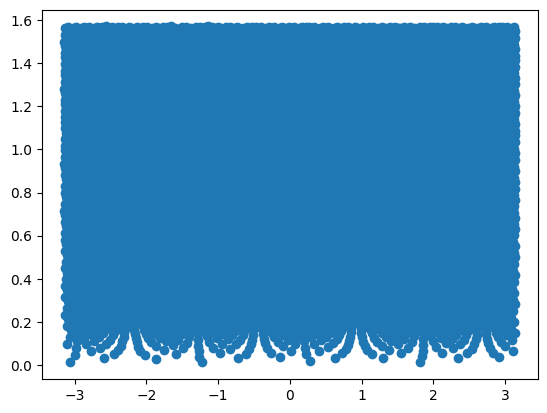

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 4.1887902092705165
initial_energy 2.9448870083026706
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 53.813129s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

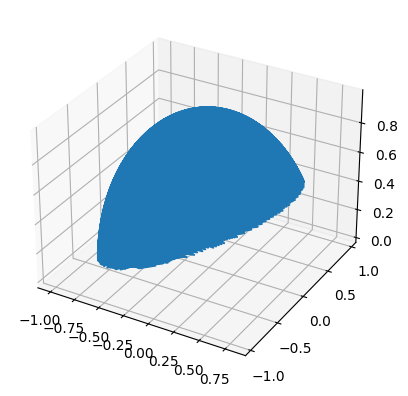

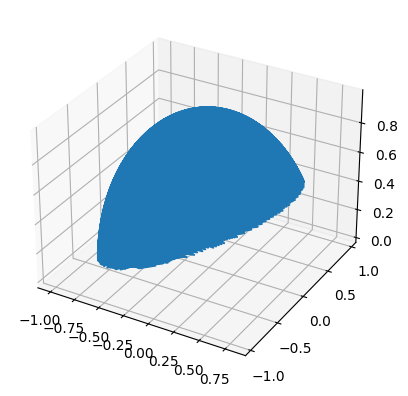

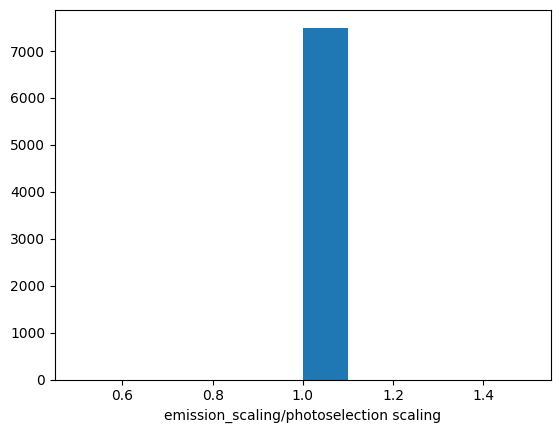

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.2999592286866494
Total energy per dipole per ray: 0.8833460355798036
Energy from Ix 2110.539169295539
Energy from Iy 3.067063104189506e-30
X/Y energy ratio = 6.881303375899287e+32
Half sphere energy 4.1887902092705165
Initial energy 2.9448870083026706
half sphere energy NA 2.944850682428919
maxr 0.004233333333333334
1677 escaped out of 10554
Saved checkpoint with 10000 rays
1677 escaped out of 10554
time in trace_rays 82.246961s
ray count 8877
max Ix 6.795030149879754
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034161478084632556
max_r_reduced 0.003416115680213837 max_r 0.0034161478084632556


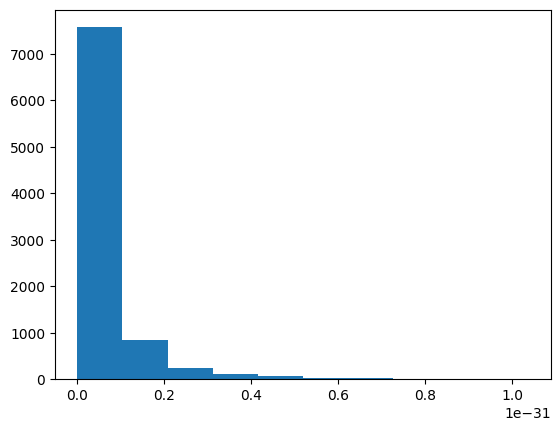

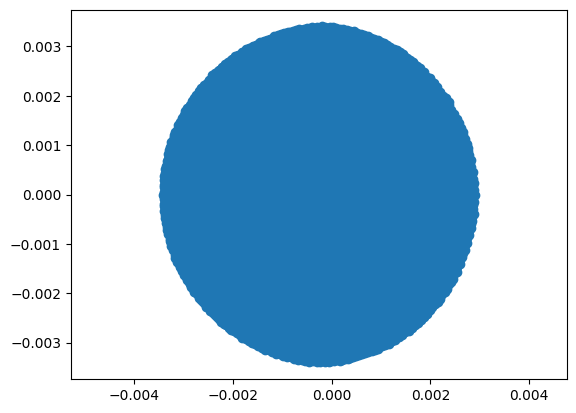

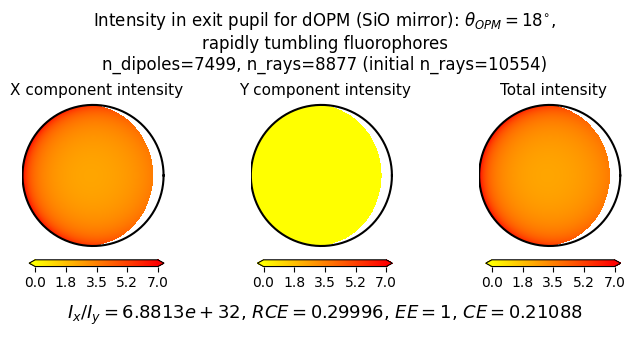

ray count 8877
max Ix 3.333547387795115
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493821805961384 max_r 0.949388830776318


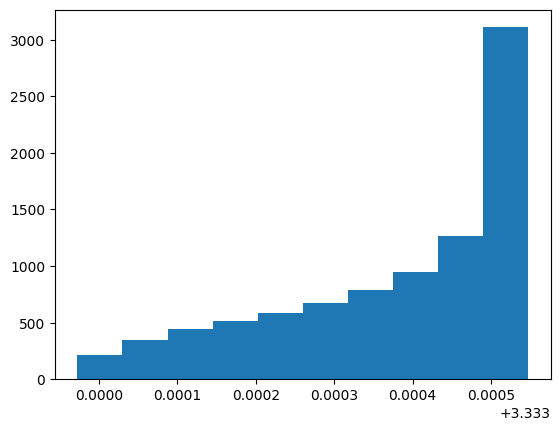

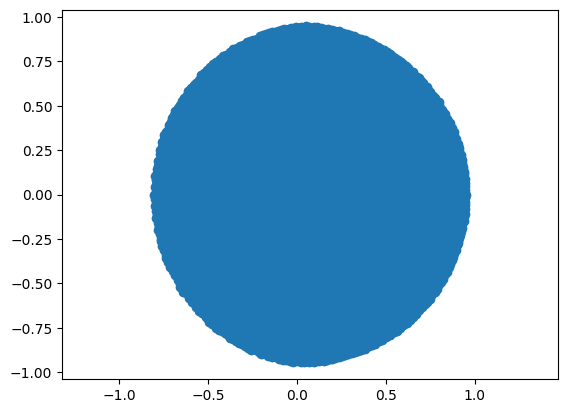

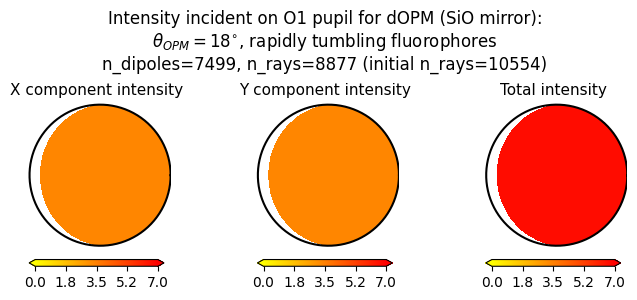

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


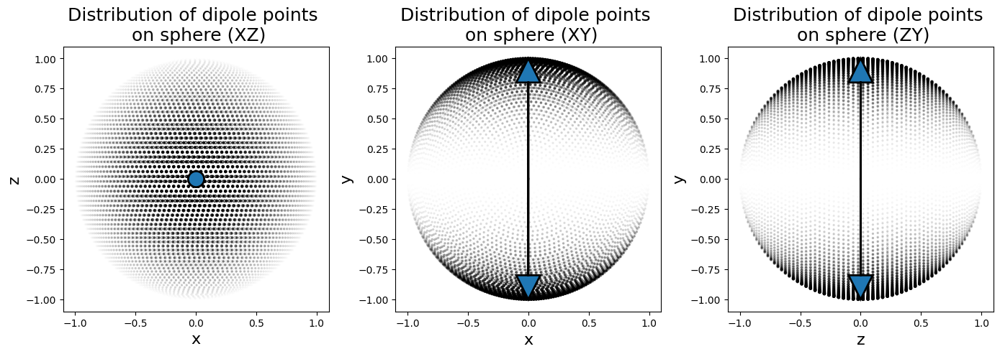

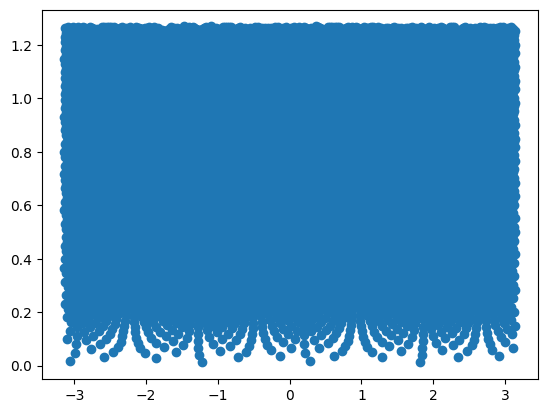

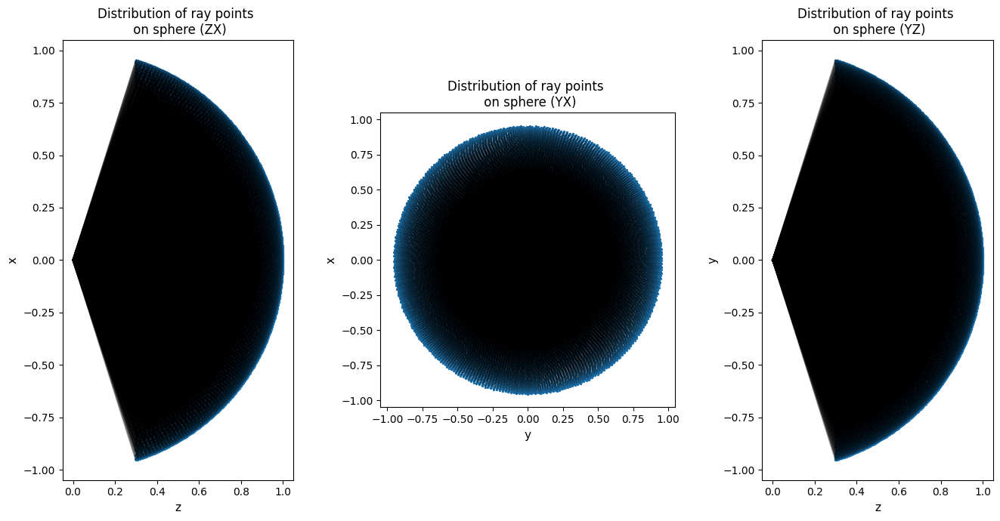

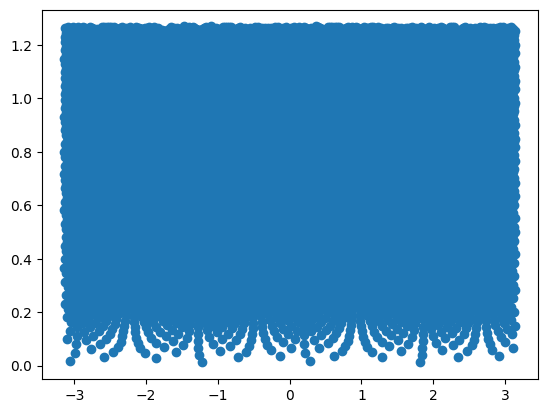

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


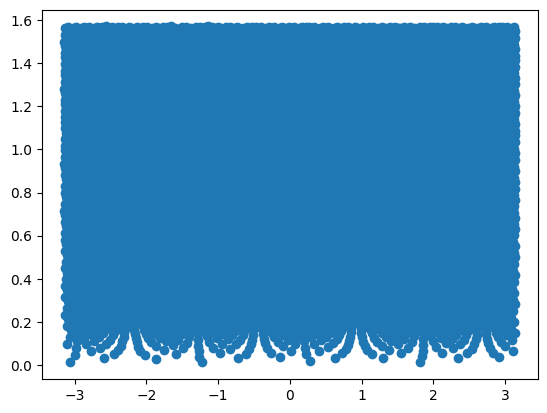

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3969878565785856
initial_energy 1.0198594547783963
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 55.661017s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACC50A8C40>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

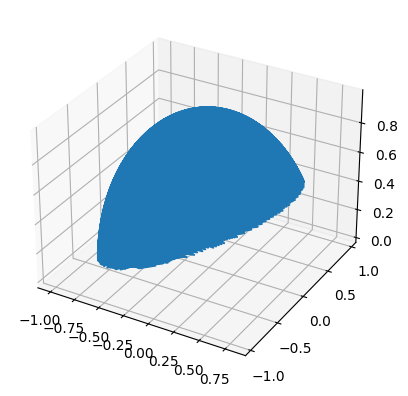

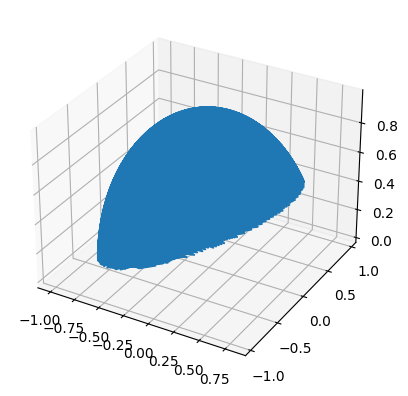

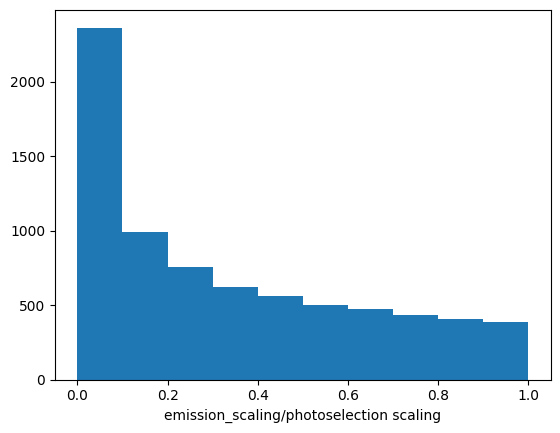

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.42822106628782763
Total energy per dipole per ray: 0.4367253031889274
Energy from Ix 1043.4482314710408
Energy from Iy 1.514174140422389e-30
X/Y energy ratio = 6.891203617966716e+32
Half sphere energy 1.3969878565785856
Initial energy 1.0198594547783963
half sphere energy NA 0.9821262076304378
maxr 0.004233333333333334
1677 escaped out of 10554
Saved checkpoint with 10000 rays
1677 escaped out of 10554
time in trace_rays 79.082401s
ray count 8877
max Ix 4.073676665869918
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034161478084632556
max_r_reduced 0.003416115680213837 max_r 0.0034161478084632556


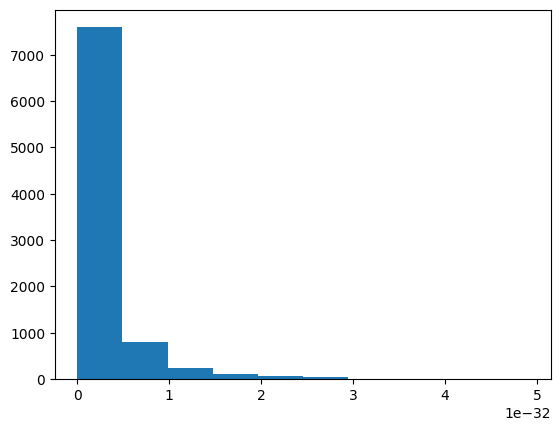

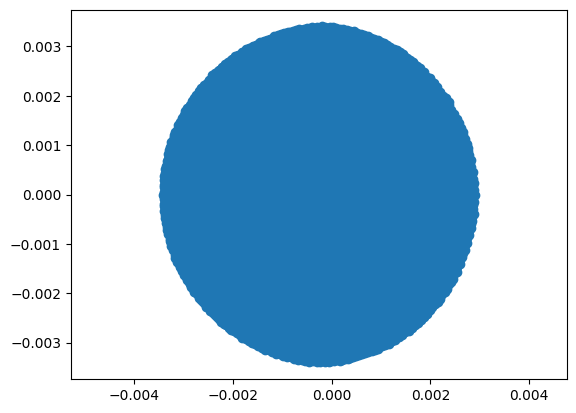

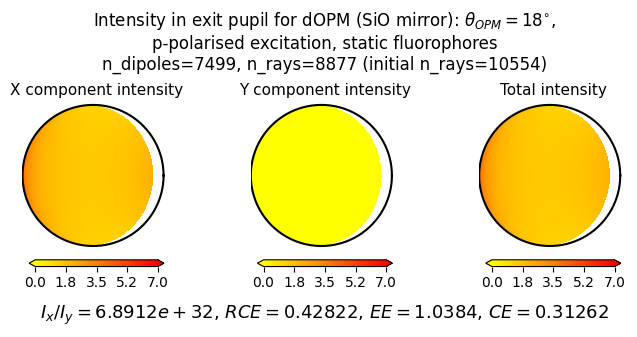

ray count 8877
max Ix 0.8246382214983282
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493821805961384 max_r 0.949388830776318


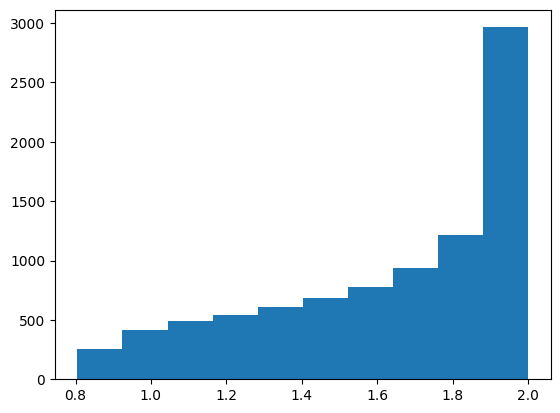

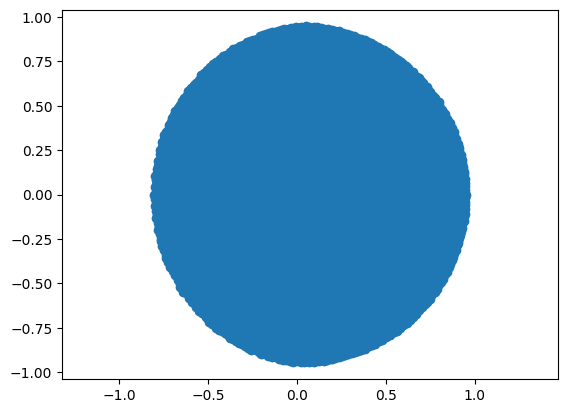

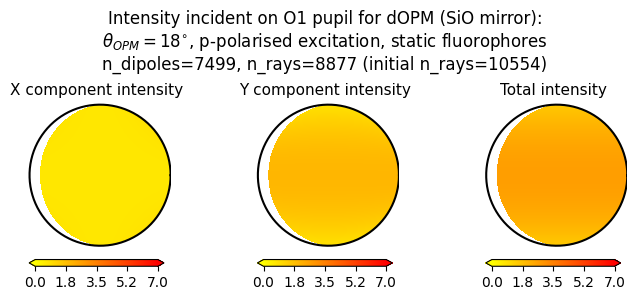

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


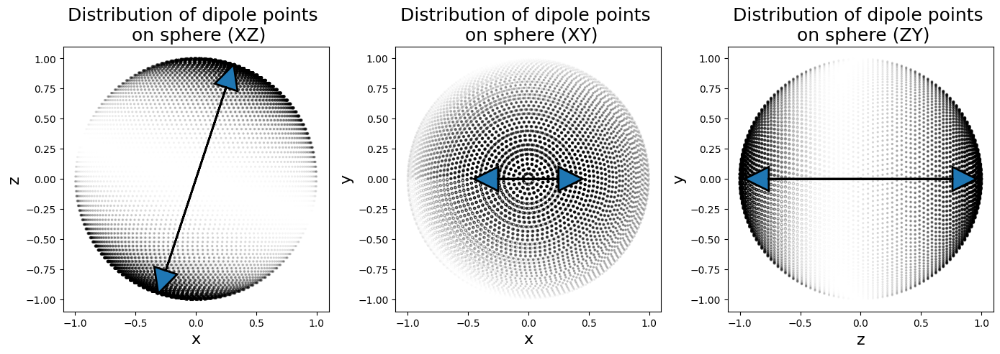

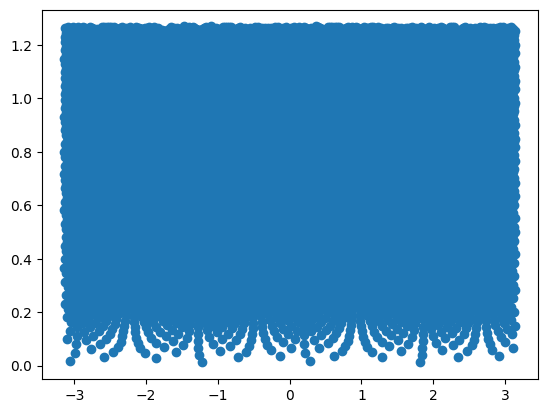

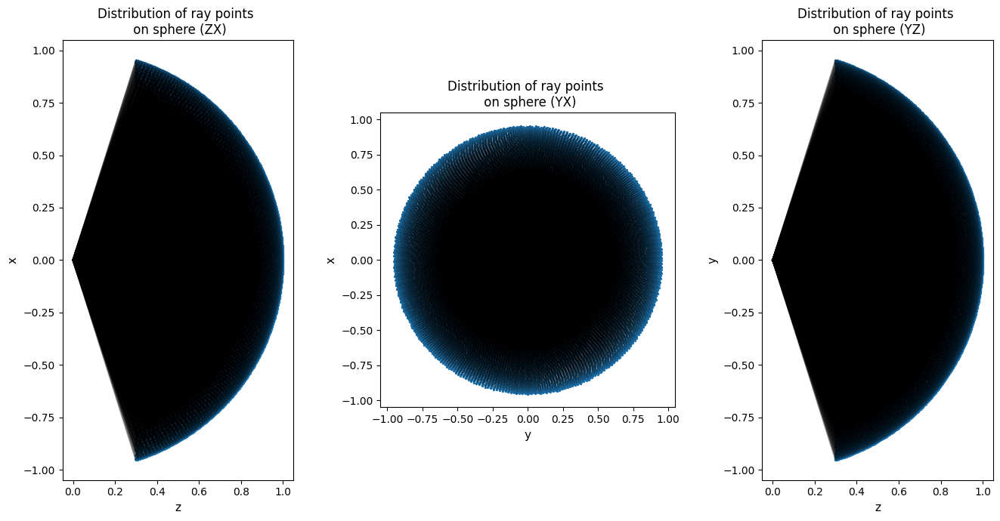

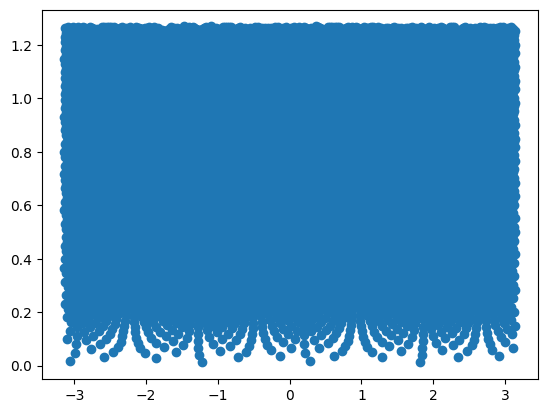

n_dipoles 7499
n_rays 10554
pvec shape (7499, 1, 3)
nvec shape (1, 10554, 3)
(7499, 10554, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()


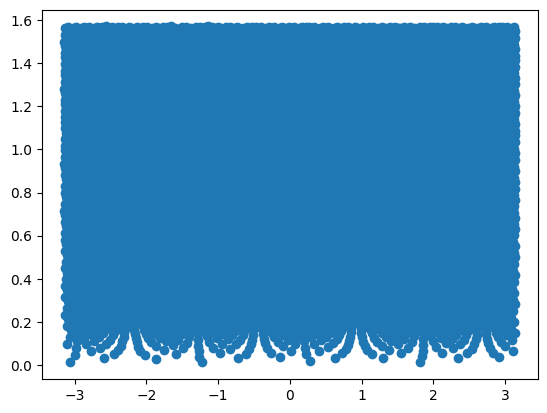

n_dipoles 7499
n_rays 14999
pvec shape (7499, 1, 3)
nvec shape (1, 14999, 3)
(7499, 14999, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  14999
(10554, 3, 1)
n rays =  10554
NA area vs real area? 4.417276018914658 4.4172760189146585
half_sphere_energy 1.3964118520472504
initial_energy 0.9173256271592871
rays when NA scaled up to hemisphere 15012.13359727216
initialisation time in system 60.267216s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2C940>
CURVED REFRACTION
max rho curved 0.003182924851418993
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CA60>
max rho flat 0.004233290052387261
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001ACC4E2CB20>
CURVED REFRACTION
max rho curved -4.173744433247827e-05
ELEMENT: <opmsim.optical_elements.LinearPolariser object at 0x000001ACD0BD4B20>
ELEMENT: <opmsim.optical_elements.WavePlate object at 0x000001ACC50A8E50>
ELEMENT: <opmsim.optical_elements.SineLens

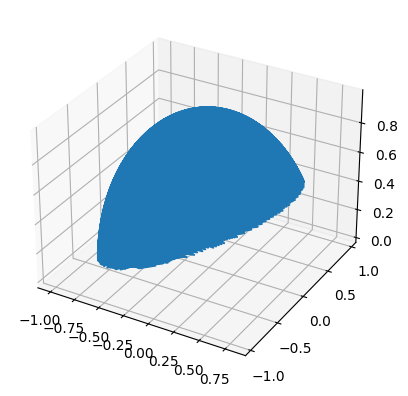

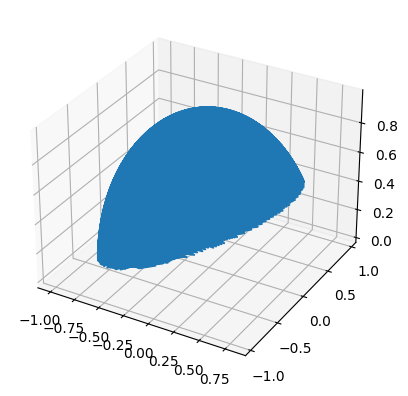

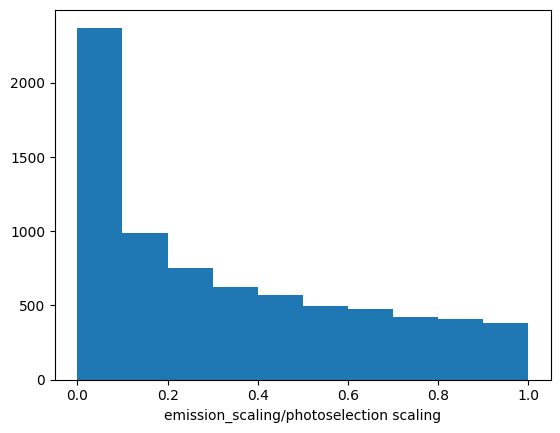

Limiting radius for detector: 0.004233333333333334
Energy ratio (efficiency): 0.2830954470215721
Total energy per dipole per ray: 0.25969070848500236
Energy from Ix 4.1295093802940205e-30
Energy from Iy 620.4673933923954
X/Y energy ratio = 6.655481696976847e-33
Half sphere energy 1.3964118520472504
Initial energy 0.9173256271592871
half sphere energy NA 0.9817212584082421
maxr 0.004233333333333334
1677 escaped out of 10554
Saved checkpoint with 10000 rays
1677 escaped out of 10554
time in trace_rays 79.324065s
ray count 8877
max Ix 1.879198180568822e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034161478084632556
max_r_reduced 0.003416115680213837 max_r 0.0034161478084632556


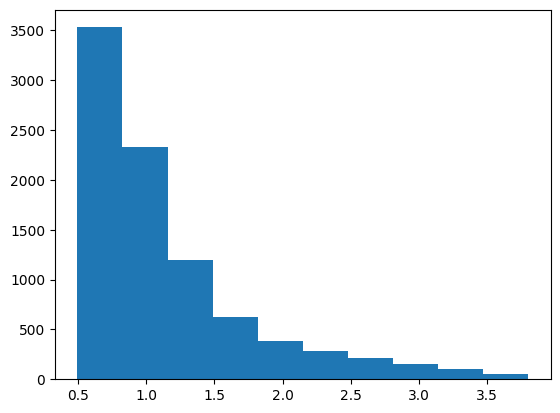

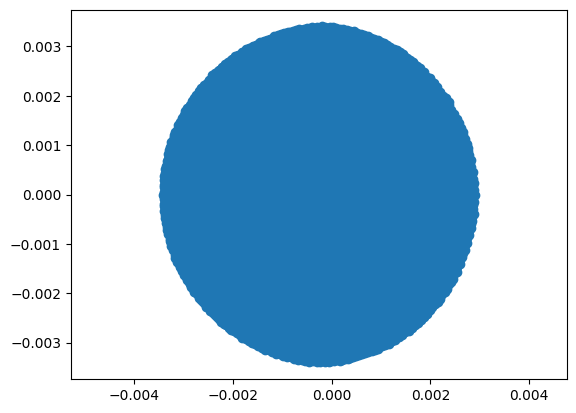

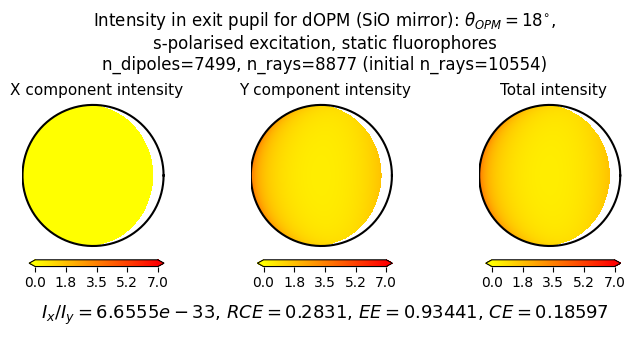

ray count 8877
max Ix 1.8674538468737598
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.949388830776318
max_r_reduced 0.9493821805961384 max_r 0.949388830776318


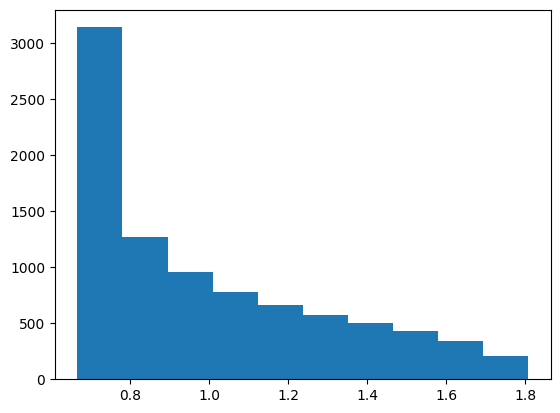

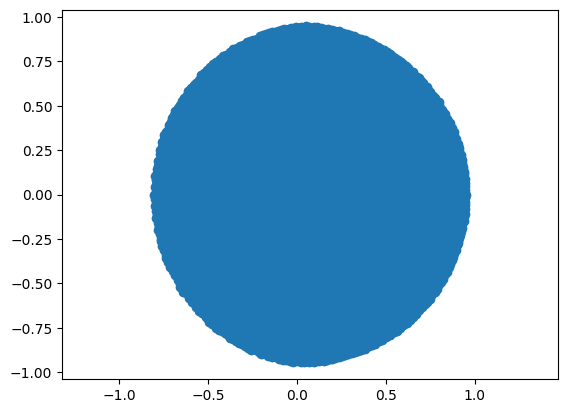

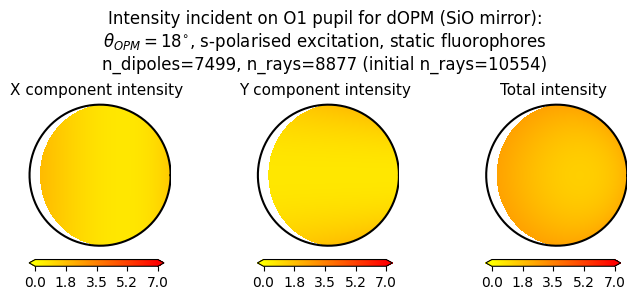

In [14]:
with open(save_details, 'w') as f:
    f.write("focal lengths:\n")
    f.write("O1,TL1,TL2,O2,O2\n")
    lenses = [el for el in elements_fun(0) if isinstance(el, optical_elements.SineLens)]
    fs=[el.focal_length for el in lenses]
    f.write(",".join(str(item) for item in fs))
    f.write("\noptions:\n")
    f.write(json.dumps(options))

with open(save_filename, 'a') as f:
    film_mats = [film_mat]#, "perfect"] 
    elements_i = [elements_fun, elements_perf_fun]
    elements_s_i = [elements_s_fun, elements_perf_s_fun]
        
    f.write("angle, film, film_thickess, polarisation, NA1, NA2, RCE, EE, CE\n")
    for i in range(len(film_mats)):  # loop over film and perfect
        film_mat_t = film_mats[i]
        for opm_angle in opm_angles:
            elements = elements_i[i](opm_angle)
            elements_s = elements_s_i[i](opm_angle)
            element_fs = []

            # un/depolarised
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)

            system = OpticalSystem("Dual view system (%d degrees) rapid tumbling" % opm_angle, elements, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, rapidly tumbling fluorophores' \
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_un)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_tumbling_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "unpolarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, rapidly tumbling fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_un)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_tumbling_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            # p-polarised 
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)
            source.classical_photoselection(p_pol)

            system = OpticalSystem("Dual view system (%d degrees) p-polarised" % opm_angle, elements, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, p-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_p)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_p-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "p-polarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, p-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_p)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_p-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight')

            # s-polarised
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)
            source.classical_photoselection(s_pol(opm_angle))

            system = OpticalSystem("Dual view system (%d degrees) s-polarised" % opm_angle, elements_s, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, s-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_s)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_s-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "s-polarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, s-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_s)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_s-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )



In [30]:
opm_angles

[0, 35, 45, 18.194872338766785]

AttributeError: 'list' object has no attribute 'any'